In [1]:
# !pip install 'zarr<3'
# !pip install timm
# !pip install openslide-python tiffslide
# !pip install cupy-cuda12x  # for CUDA 12.x
# !pip install geopandas pyarrow

In [2]:
# ALWAYS RUN THIS FIRST!
import os
import sys
from pathlib import Path

NOTEBOOK_DIR = Path("/rsrch9/home/plm/idso_fa1_pathology/codes/yshokrollahi/vitamin-p-latest")
os.chdir(NOTEBOOK_DIR)
sys.path.insert(0, str(NOTEBOOK_DIR))

print(f"✅ Working directory: {os.getcwd()}")


✅ Working directory: /rsrch9/home/plm/idso_fa1_pathology/codes/yshokrollahi/vitamin-p-latest


Found 20 sample directories

Extracting metadata from all samples...

=== All Samples Metadata ===
ID   Case Name       Chunk    Tissue Type     H&E Filename                        mIF Filename                       
------------------------------------------------------------------------------------------------------------------------
1    CRC31           55       colorectal      CRC31-he_chunk_55.png               CRC31-mif_chunk_55_combined.png    
2    CRC31           45       colorectal      CRC31-he_chunk_45.png               CRC31-mif_chunk_45_combined.png    
3    CRC28           59       colorectal      CRC28-he_chunk_59.png               CRC28-mif_chunk_59_combined.png    
4    CRC28           30       colorectal      CRC28-he_chunk_30.png               CRC28-mif_chunk_30_combined.png    
5    CRC28           58       colorectal      CRC28-he_chunk_58.png               CRC28-mif_chunk_58_combined.png    
6    breast          49       breast          breast-he_chunk_49.png    

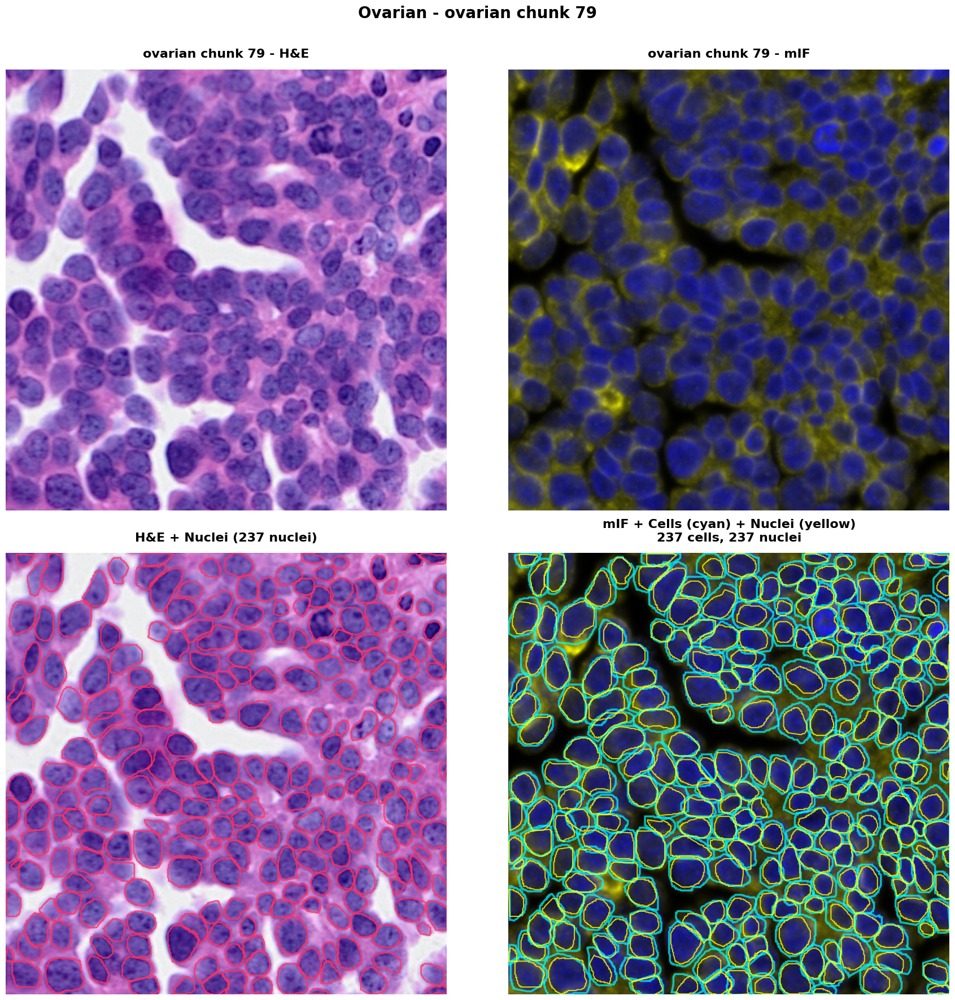

In [3]:
"""
Script to:
1. Read all samples and extract metadata (case name, chunk number, tissue type)
2. Store this info for later AI inference
3. Randomly visualize one sample
NO SAVING - just display and return metadata
"""

import os
import json
import random
import re
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from PIL import Image
import glob

# Set the base directory
BASE_DIR = "/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Pathology_val"

def extract_sample_metadata(sample_dir):
    """Extract metadata from sample directory"""
    # Find IMAGE files only
    image_extensions = ['.png', '.jpg', '.jpeg', '.tif', '.tiff']
    all_files = glob.glob(os.path.join(sample_dir, "*"))
    
    he_images = [f for f in all_files 
                 if any(f.lower().endswith(ext) for ext in image_extensions)
                 and '-he' in f.lower() 
                 and 'mif' not in f.lower()]
    
    mif_images = [f for f in all_files 
                  if any(f.lower().endswith(ext) for ext in image_extensions)
                  and 'mif' in f.lower()]
    
    geojson_files = [f for f in all_files if f.endswith('.geojson')]
    
    if not he_images or not mif_images or not geojson_files:
        return None
    
    # Extract metadata from H&E filename
    he_filename = os.path.basename(he_images[0])
    mif_filename = os.path.basename(mif_images[0])
    geojson_filename = os.path.basename(geojson_files[0])
    
    # Parse filename: e.g., "CRC31-he_chunk_55.png" or "breast-he_chunk_49.png"
    # Pattern: {case_name}-he_chunk_{chunk_number}.png
    match = re.match(r'(.+?)-he_chunk_(\d+)', he_filename)
    
    if match:
        case_name = match.group(1)
        chunk_number = match.group(2)
    else:
        case_name = "unknown"
        chunk_number = "unknown"
    
    # Determine tissue type from case name
    if case_name.startswith('CRC'):
        tissue_type = 'colorectal'
    elif 'breast' in case_name.lower():
        tissue_type = 'breast'
    elif 'cervical' in case_name.lower():
        tissue_type = 'cervical'
    elif 'lung' in case_name.lower():
        tissue_type = 'lung'
    elif 'ovarian' in case_name.lower():
        tissue_type = 'ovarian'
    elif 'prostate' in case_name.lower():
        tissue_type = 'prostate'
    else:
        tissue_type = 'unknown'
    
    return {
        'sample_id': os.path.basename(sample_dir),
        'case_name': case_name,
        'chunk_number': chunk_number,
        'tissue_type': tissue_type,
        'he_path': he_images[0],
        'mif_path': mif_images[0],
        'geojson_path': geojson_files[0],
        'he_filename': he_filename,
        'mif_filename': mif_filename,
        'geojson_filename': geojson_filename
    }

def load_geojson(geojson_path):
    """Load GeoJSON file containing cell and nuclei annotations"""
    with open(geojson_path, 'r') as f:
        data = json.load(f)
    return data

def parse_annotations(geojson_data):
    """Parse GeoJSON to extract cell and nuclei polygons"""
    cells = []
    nuclei = []
    
    if 'features' in geojson_data:
        for feature in geojson_data['features']:
            coords = feature['geometry']['coordinates']
            properties = feature.get('properties', {})
            
            classification = properties.get('classification', {})
            if isinstance(classification, dict):
                annotation_type = classification.get('name', '').lower()
            else:
                annotation_type = str(classification).lower()
            
            object_type = properties.get('objectType', '').lower()
            
            if 'cell' in annotation_type or 'cell' in object_type:
                cells.append(coords)
            elif 'detection' in object_type or 'nucleus' in annotation_type or 'nuclei' in annotation_type:
                nuclei.append(coords)
            else:
                nuclei.append(coords)
    
    return cells, nuclei

def visualize_sample(metadata):
    """Visualize a sample using its metadata"""
    
    print(f"\n{'='*80}")
    print(f"Visualizing Sample")
    print(f"{'='*80}")
    print(f"Sample ID:     {metadata['sample_id']}")
    print(f"Case Name:     {metadata['case_name']}")
    print(f"Chunk:         {metadata['chunk_number']}")
    print(f"Tissue Type:   {metadata['tissue_type']}")
    print(f"H&E File:      {metadata['he_filename']}")
    print(f"mIF File:      {metadata['mif_filename']}")
    print(f"GeoJSON:       {metadata['geojson_filename']}")
    
    # Load images
    he_img = Image.open(metadata['he_path'])
    mif_img = Image.open(metadata['mif_path'])
    
    # Load annotations
    geojson_data = load_geojson(metadata['geojson_path'])
    cells, nuclei = parse_annotations(geojson_data)
    
    print(f"\nAnnotations:   {len(cells)} cells, {len(nuclei)} nuclei")
    print(f"Image Size:    {he_img.size[0]} x {he_img.size[1]} pixels")
    print(f"{'='*80}\n")
    
    # Create visualization
    fig, axes = plt.subplots(2, 2, figsize=(18, 18))
    
    # H&E image only
    axes[0, 0].imshow(he_img)
    axes[0, 0].set_title(f'{metadata["case_name"]} chunk {metadata["chunk_number"]} - H&E', 
                         fontsize=16, fontweight='bold', pad=15)
    axes[0, 0].axis('off')
    
    # mIF image only
    axes[0, 1].imshow(mif_img)
    axes[0, 1].set_title(f'{metadata["case_name"]} chunk {metadata["chunk_number"]} - mIF', 
                         fontsize=16, fontweight='bold', pad=15)
    axes[0, 1].axis('off')
    
    # H&E with nuclei overlay
    axes[1, 0].imshow(he_img)
    drawn_nuclei = 0
    for nucleus_coords in nuclei:
        coords_array = nucleus_coords
        while isinstance(coords_array, list) and len(coords_array) > 0 and isinstance(coords_array[0], list):
            if len(coords_array[0]) == 2 and isinstance(coords_array[0][0], (int, float)):
                break
            coords_array = coords_array[0]
        
        if len(coords_array) > 2:
            poly = Polygon(coords_array, fill=False, edgecolor='#FF3366', linewidth=2, alpha=0.8)
            axes[1, 0].add_patch(poly)
            drawn_nuclei += 1
    
    axes[1, 0].set_title(f'H&E + Nuclei ({drawn_nuclei} nuclei)', 
                         fontsize=16, fontweight='bold', pad=15)
    axes[1, 0].axis('off')
    
    # mIF with cells AND nuclei overlay
    axes[1, 1].imshow(mif_img)
    
    drawn_cells = 0
    for cell_coords in cells:
        coords_array = cell_coords
        while isinstance(coords_array, list) and len(coords_array) > 0 and isinstance(coords_array[0], list):
            if len(coords_array[0]) == 2 and isinstance(coords_array[0][0], (int, float)):
                break
            coords_array = coords_array[0]
        
        if len(coords_array) > 2:
            poly = Polygon(coords_array, fill=False, edgecolor='#00FFFF', linewidth=2.5, alpha=0.7)
            axes[1, 1].add_patch(poly)
            drawn_cells += 1
    
    drawn_nuclei_mif = 0
    for nucleus_coords in nuclei:
        coords_array = nucleus_coords
        while isinstance(coords_array, list) and len(coords_array) > 0 and isinstance(coords_array[0], list):
            if len(coords_array[0]) == 2 and isinstance(coords_array[0][0], (int, float)):
                break
            coords_array = coords_array[0]
        
        if len(coords_array) > 2:
            poly = Polygon(coords_array, fill=False, edgecolor='#FFFF00', linewidth=1.5, alpha=0.8)
            axes[1, 1].add_patch(poly)
            drawn_nuclei_mif += 1
    
    axes[1, 1].set_title(f'mIF + Cells (cyan) + Nuclei (yellow)\n{drawn_cells} cells, {drawn_nuclei_mif} nuclei', 
                         fontsize=16, fontweight='bold', pad=15)
    axes[1, 1].axis('off')
    
    plt.suptitle(f'{metadata["tissue_type"].title()} - {metadata["case_name"]} chunk {metadata["chunk_number"]}', 
                 fontsize=20, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

def main():
    """Main function to read all samples and visualize one randomly"""
    
    if not os.path.exists(BASE_DIR):
        print(f"ERROR: Directory not found: {BASE_DIR}")
        return None
    
    # Get all subdirectories (samples)
    sample_dirs = [d for d in glob.glob(os.path.join(BASE_DIR, "*")) if os.path.isdir(d)]
    sample_dirs = sorted(sample_dirs, key=lambda x: int(os.path.basename(x)) if os.path.basename(x).isdigit() else 0)
    
    print(f"Found {len(sample_dirs)} sample directories")
    print("\nExtracting metadata from all samples...")
    
    # Extract metadata for all samples
    all_samples = []
    for sample_dir in sample_dirs:
        metadata = extract_sample_metadata(sample_dir)
        if metadata:
            all_samples.append(metadata)
    
    # Print summary table
    print("\n" + "="*120)
    print("=== All Samples Metadata ===")
    print("="*120)
    print(f"{'ID':<4} {'Case Name':<15} {'Chunk':<8} {'Tissue Type':<15} {'H&E Filename':<35} {'mIF Filename':<35}")
    print("-"*120)
    
    for sample in all_samples:
        print(f"{sample['sample_id']:<4} {sample['case_name']:<15} {sample['chunk_number']:<8} "
              f"{sample['tissue_type']:<15} {sample['he_filename']:<35} {sample['mif_filename']:<35}")
    
    print("="*120)
    
    # Count by tissue type
    tissue_counts = {}
    for sample in all_samples:
        tissue = sample['tissue_type']
        tissue_counts[tissue] = tissue_counts.get(tissue, 0) + 1
    
    print("\nTissue Type Distribution:")
    for tissue, count in sorted(tissue_counts.items()):
        print(f"  {tissue.title():<15}: {count:>2} samples")
    
    print(f"\nTotal: {len(all_samples)} samples")
    print("="*120)
    
    # Randomly select one sample to visualize
    selected_sample = random.choice(all_samples)
    print(f"\nRandomly selected sample for visualization: {selected_sample['case_name']} chunk {selected_sample['chunk_number']}")
    
    # Visualize the selected sample
    visualize_sample(selected_sample)
    
    return all_samples

if __name__ == "__main__":
    all_samples_metadata = main()
    
    # This metadata can be used later for AI inference
    # all_samples_metadata contains all file paths and case information

##  load dataset

In [4]:
# Cell 3: Import and create dataloaders
from dataset import Config, create_dataloaders

# Just use the correct relative path from your working directory
config = Config("configs/training/config_fold21.yaml")  # Note: "configs" not "config"
config.print_config()

train_loader, val_loader, test_loader = create_dataloaders(config)
print("\n✅ Ready to use!")

✅ CRC Dataset Package v1.0.0 loaded
CRC DATASET CONFIGURATION
Config File: configs/training/config_fold21.yaml
Zarr Base: /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/ORION-CRC/zarr_data
Cache: Disabled
Strategy: memory

📊 Data Splits:
  Train: 45 samples
  Val: 4 samples
  Test: 1 samples

🔄 DataLoader:
  Batch Size: 4
  Num Workers: 0
  Pin Memory: True

🎨 Augmentation:
  Training: True
  Probability: 0.0

🎯 HV Maps:
  Generate: True
  Method: pannuke
  HE Nuclei: True
  HE Cells: True
  MIF Nuclei: True
  MIF Cells: True

🔍 Filtering:
  Min Instances: 0
  Filter Empty: True

CREATING DATALOADERS
Strategy: memory
Use Cache: False
Batch Size: 4
Num Workers: 0

Train split: 37 CRC + 8 Xenium samples
Val split: 3 CRC + 1 Xenium samples
Test split: 1 CRC + 0 Xenium samples

📊 Building patch index for 45 samples...
  ✅ prostate (Xenium): 1011 patches
  ✅ CRC27 (CRC): 29 patches
  ✅ CRC26 (CRC): 42 patches
  ✅ CRC33_01 (CRC): 25 patches
  ✅ CRC20 (CRC): 35 patches
  ✅ CRC13 (CR

## check dataset

In [5]:
"""
Explore Zarr-based CRC dataset and match with pathologist validation samples
FIXED: Handle tuple-based patch_info
"""

from collections import defaultdict

print("="*80)
print("DATASET STRUCTURE ANALYSIS")
print("="*80)

# Access the dataset objects
train_dataset = train_loader.dataset
val_dataset = val_loader.dataset
test_dataset = test_loader.dataset

print(f"\nTrain Dataset:")
print(f"  Samples: {train_dataset.samples}")
print(f"  Total patches: {len(train_dataset)}")

print(f"\nValidation Dataset:")
print(f"  Samples: {val_dataset.samples}")
print(f"  Total patches: {len(val_dataset)}")

print(f"\nTest Dataset:")
print(f"  Samples: {test_dataset.samples}")
print(f"  Total patches: {len(test_dataset)}")

# Inspect patch_info structure
print("\n" + "="*80)
print("INSPECTING PATCH INFO STRUCTURE")
print("="*80)
print(f"\nFirst patch_info item type: {type(train_dataset.patch_info[0])}")
print(f"First patch_info item: {train_dataset.patch_info[0]}")
print(f"Length: {len(train_dataset.patch_info[0]) if hasattr(train_dataset.patch_info[0], '__len__') else 'N/A'}")

# Get patch info from datasets
print("\n" + "="*80)
print("PATCH DISTRIBUTION BY SAMPLE")
print("="*80)

def get_patch_distribution(dataset, split_name):
    """Get distribution of patches across samples"""
    patch_info = dataset.patch_info
    
    print(f"\n{split_name} Set:")
    print(f"  Total samples: {len(dataset.samples)}")
    print(f"  Total patches: {len(patch_info)}")
    
    # Count patches per sample
    sample_patch_counts = defaultdict(int)
    
    # patch_info appears to be a list of tuples: (sample_name, patch_idx)
    for info in patch_info:
        if isinstance(info, tuple):
            sample_name = info[0]  # First element is sample name
        elif isinstance(info, dict):
            sample_name = info['sample']
        else:
            sample_name = str(info)
        
        sample_patch_counts[sample_name] += 1
    
    print(f"\n  Patches per sample:")
    for sample in sorted(sample_patch_counts.keys()):
        count = sample_patch_counts[sample]
        tissue_type = "CRC" if sample.startswith("CRC") else "Xenium"
        print(f"    {sample:<15} ({tissue_type:>6}): {count:>4} patches")
    
    return sample_patch_counts

train_patches = get_patch_distribution(train_dataset, "TRAIN")
val_patches = get_patch_distribution(val_dataset, "VALIDATION")
test_patches = get_patch_distribution(test_dataset, "TEST")

# Now match with pathologist validation samples
print("\n" + "="*80)
print("MATCHING WITH PATHOLOGIST VALIDATION SAMPLES")
print("="*80)

# Your 20 pathologist-validated samples
pathologist_samples = [
    {'id': 1, 'case': 'CRC31', 'chunk': 55, 'tissue': 'colorectal'},
    {'id': 2, 'case': 'CRC31', 'chunk': 45, 'tissue': 'colorectal'},
    {'id': 3, 'case': 'CRC28', 'chunk': 59, 'tissue': 'colorectal'},
    {'id': 4, 'case': 'CRC28', 'chunk': 30, 'tissue': 'colorectal'},
    {'id': 5, 'case': 'CRC28', 'chunk': 58, 'tissue': 'colorectal'},
    {'id': 6, 'case': 'breast', 'chunk': 49, 'tissue': 'breast'},
    {'id': 7, 'case': 'breast', 'chunk': 79, 'tissue': 'breast'},
    {'id': 8, 'case': 'breast', 'chunk': 63, 'tissue': 'breast'},
    {'id': 9, 'case': 'cervical', 'chunk': 53, 'tissue': 'cervical'},
    {'id': 10, 'case': 'cervical', 'chunk': 25, 'tissue': 'cervical'},
    {'id': 11, 'case': 'cervical', 'chunk': 9, 'tissue': 'cervical'},
    {'id': 12, 'case': 'lung', 'chunk': 29, 'tissue': 'lung'},
    {'id': 13, 'case': 'lung', 'chunk': 49, 'tissue': 'lung'},
    {'id': 14, 'case': 'ovarian', 'chunk': 1, 'tissue': 'ovarian'},
    {'id': 15, 'case': 'ovarian', 'chunk': 4, 'tissue': 'ovarian'},
    {'id': 16, 'case': 'ovarian', 'chunk': 79, 'tissue': 'ovarian'},
    {'id': 17, 'case': 'prostate', 'chunk': 95, 'tissue': 'prostate'},
    {'id': 18, 'case': 'prostate', 'chunk': 92, 'tissue': 'prostate'},
    {'id': 19, 'case': 'prostate', 'chunk': 48, 'tissue': 'prostate'},
    {'id': 20, 'case': 'CRC28', 'chunk': 43, 'tissue': 'colorectal'},
]

print("\nPathologist Validation Sample Distribution:")
print(f"{'Sample ID':<12} {'Case':<15} {'Chunk':<8} {'Dataset Split':<15} {'Available?':<12}")
print("-"*80)

# Check which split each pathologist sample belongs to
for sample in pathologist_samples:
    case = sample['case']
    chunk = sample['chunk']
    
    # Check which split this case is in
    if case in train_dataset.samples:
        split = "TRAIN"
        available = "✓ Yes"
    elif case in val_dataset.samples:
        split = "VALIDATION"
        available = "✓ Yes"
    elif case in test_dataset.samples:
        split = "TEST"
        available = "✓ Yes"
    else:
        split = "NOT FOUND"
        available = "✗ No"
    
    print(f"{sample['id']:<12} {case:<15} {chunk:<8} {split:<15} {available:<12}")

# Summary statistics
print("\n" + "="*80)
print("SUMMARY")
print("="*80)

# Count pathologist samples per split
split_counts = defaultdict(int)
case_counts = defaultdict(int)

for sample in pathologist_samples:
    case = sample['case']
    case_counts[case] += 1
    
    if case in train_dataset.samples:
        split_counts['TRAIN'] += 1
    elif case in val_dataset.samples:
        split_counts['VALIDATION'] += 1
    elif case in test_dataset.samples:
        split_counts['TEST'] += 1
    else:
        split_counts['NOT FOUND'] += 1

print(f"\nPathologist samples by split:")
for split, count in sorted(split_counts.items()):
    print(f"  {split:<15}: {count:>2} samples")

print(f"\nPathologist samples by case:")
for case, count in sorted(case_counts.items()):
    print(f"  {case:<15}: {count:>2} chunks")

print(f"\nTotal pathologist validation samples: {len(pathologist_samples)}")

# Identify which cases have pathologist annotations
print("\n" + "="*80)
print("CASES WITH PATHOLOGIST ANNOTATIONS")
print("="*80)

annotated_cases = set(s['case'] for s in pathologist_samples)
print(f"\nCases with pathologist annotations: {len(annotated_cases)}")
for case in sorted(annotated_cases):
    chunks = [s['chunk'] for s in pathologist_samples if s['case'] == case]
    
    # Check which split this case is in
    if case in train_dataset.samples:
        split = "TRAIN"
    elif case in val_dataset.samples:
        split = "VALIDATION"
    elif case in test_dataset.samples:
        split = "TEST"
    else:
        split = "NOT FOUND"
    
    print(f"  {case:<15} ({split:<12}): chunks {sorted(chunks)}")

print("\n" + "="*80)
print("\n✅ Key Findings:")
print(f"  - CRC31 is in VALIDATION (2 pathologist chunks)")
print(f"  - CRC28 is in TRAIN (4 pathologist chunks)")
print(f"  - Xenium samples (breast, cervical, lung, ovarian, prostate) distribution varies")
print("="*80)

DATASET STRUCTURE ANALYSIS

Train Dataset:
  Samples: ['prostate', 'CRC27', 'CRC26', 'CRC33_01', 'CRC20', 'CRC13', 'CRC05', 'CRC37', 'CRC09', 'CRC04', 'CRC07', 'breast', 'ovarian', 'pancreasV1', 'CRC16', 'CRC10', 'CRC17', 'CRC25', 'CRC34', 'CRC32', 'CRC01', 'lungV1', 'CRC28', 'CRC33_02', 'CRC06', 'CRC30', 'CRC12', 'CRC36', 'CRC02', 'CRC22', 'CRC03', 'lung', 'CRC35', 'CRC24', 'CRC40', 'CRC11', 'CRC23', 'CRC19', 'skin', 'CRC21', 'CRC08', 'cervical', 'CRC15', 'CRC29', 'CRC38']
  Total patches: 4884

Validation Dataset:
  Samples: ['CRC18', 'CRC31', 'CRC14', 'lymph_node']
  Total patches: 300

Test Dataset:
  Samples: ['CRC39']
  Total patches: 62

INSPECTING PATCH INFO STRUCTURE

First patch_info item type: <class 'tuple'>
First patch_info item: ('prostate', 0)
Length: 2

PATCH DISTRIBUTION BY SAMPLE

TRAIN Set:
  Total samples: 45
  Total patches: 4884

  Patches per sample:
    CRC01           (   CRC):   36 patches
    CRC02           (   CRC):   75 patches
    CRC03           (   CRC)

## pathologist vs GT

Visualizing a VALIDATION sample:

COMPARING: CRC31 chunk 55 (Pathologist Sample 1)

Pathologist annotations loaded:
  H&E image: CRC31-he_chunk_55.png
  mIF image: CRC31-mif_chunk_55_combined.png
  Cells: 51
  Nuclei: 51

Dataset split: VALIDATION
Found patch at index: 135

Dataset ground truth instances:
  H&E nuclei: 96
  H&E cells: 119
  mIF nuclei: 122
  mIF cells: 119



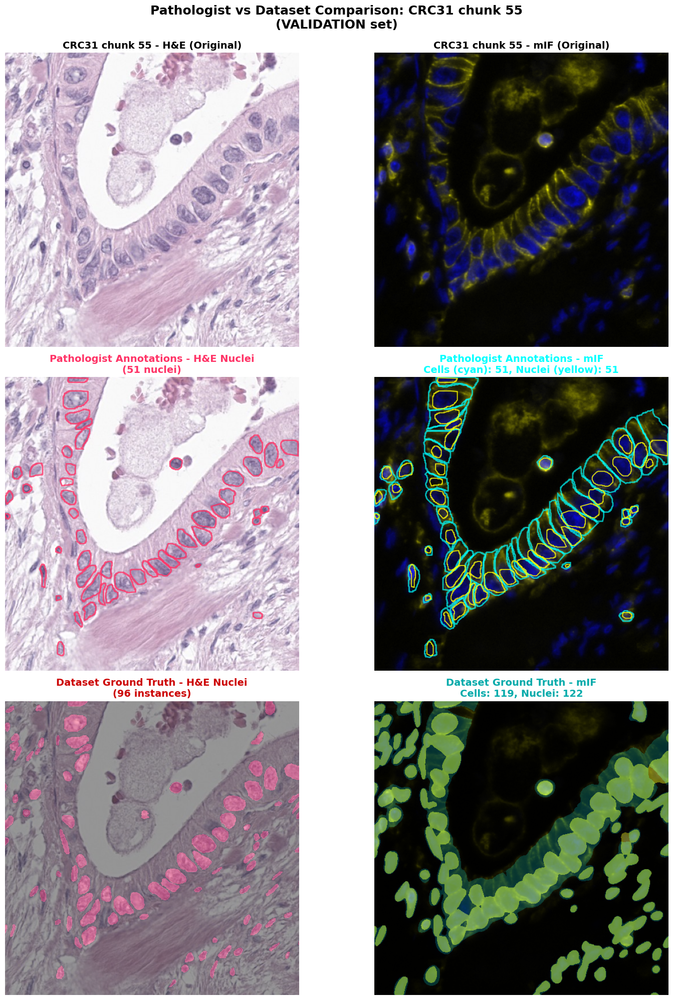


COMPARISON SUMMARY:
Pathologist:  51 nuclei, 51 cells
Dataset GT:   96 H&E nuclei, 122 mIF nuclei, 119 mIF cells



In [6]:
"""
Compare pathologist manual annotations with dataset ground truth
Shows side-by-side comparison of:
1. Pathologist GeoJSON annotations (from validation folder)
2. Dataset ground truth masks (from zarr data)
"""

import os
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from PIL import Image
import glob
import torch

# Paths
PATHOLOGIST_DIR = "/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Pathology_val"

def load_geojson(geojson_path):
    """Load GeoJSON file containing cell and nuclei annotations"""
    with open(geojson_path, 'r') as f:
        data = json.load(f)
    return data

def parse_annotations(geojson_data):
    """Parse GeoJSON to extract cell and nuclei polygons"""
    cells = []
    nuclei = []
    
    if 'features' in geojson_data:
        for feature in geojson_data['features']:
            coords = feature['geometry']['coordinates']
            properties = feature.get('properties', {})
            
            classification = properties.get('classification', {})
            if isinstance(classification, dict):
                annotation_type = classification.get('name', '').lower()
            else:
                annotation_type = str(classification).lower()
            
            object_type = properties.get('objectType', '').lower()
            
            if 'cell' in annotation_type or 'cell' in object_type:
                cells.append(coords)
            elif 'detection' in object_type or 'nucleus' in annotation_type or 'nuclei' in annotation_type:
                nuclei.append(coords)
            else:
                nuclei.append(coords)
    
    return cells, nuclei

def find_matching_patch_in_dataset(case_name, chunk_num, dataset):
    """Find the matching patch in the dataset"""
    # Look through dataset patch_info to find this specific chunk
    for idx, (sample, patch_idx) in enumerate(dataset.patch_info):
        if sample == case_name and patch_idx == chunk_num:
            return idx
    return None

def visualize_comparison(sample_id, case_name, chunk_num):
    """
    Visualize pathologist annotations vs dataset ground truth
    
    Args:
        sample_id: Pathologist sample ID (1-20)
        case_name: Case name (e.g., 'CRC31', 'breast')
        chunk_num: Chunk number
    """
    
    print(f"\n{'='*80}")
    print(f"COMPARING: {case_name} chunk {chunk_num} (Pathologist Sample {sample_id})")
    print(f"{'='*80}\n")
    
    # 1. Load pathologist annotations
    pathologist_sample_dir = os.path.join(PATHOLOGIST_DIR, str(sample_id))
    
    # Find files
    image_extensions = ['.png', '.jpg', '.jpeg', '.tif', '.tiff']
    all_files = glob.glob(os.path.join(pathologist_sample_dir, "*"))
    
    he_images = [f for f in all_files 
                 if any(f.lower().endswith(ext) for ext in image_extensions)
                 and '-he' in f.lower() 
                 and 'mif' not in f.lower()]
    
    mif_images = [f for f in all_files 
                  if any(f.lower().endswith(ext) for ext in image_extensions)
                  and 'mif' in f.lower()]
    
    geojson_files = [f for f in all_files if f.endswith('.geojson')]
    
    # Load pathologist data
    he_img = Image.open(he_images[0])
    mif_img = Image.open(mif_images[0])
    geojson_data = load_geojson(geojson_files[0])
    path_cells, path_nuclei = parse_annotations(geojson_data)
    
    print(f"Pathologist annotations loaded:")
    print(f"  H&E image: {os.path.basename(he_images[0])}")
    print(f"  mIF image: {os.path.basename(mif_images[0])}")
    print(f"  Cells: {len(path_cells)}")
    print(f"  Nuclei: {len(path_nuclei)}\n")
    
    # 2. Load dataset ground truth
    # Determine which dataset split
    if case_name in train_loader.dataset.samples:
        dataset = train_loader.dataset
        split_name = "TRAIN"
    elif case_name in val_loader.dataset.samples:
        dataset = val_loader.dataset
        split_name = "VALIDATION"
    elif case_name in test_loader.dataset.samples:
        dataset = test_loader.dataset
        split_name = "TEST"
    else:
        print(f"❌ {case_name} not found in any dataset split!")
        return
    
    print(f"Dataset split: {split_name}")
    
    # Find the matching patch
    patch_idx = find_matching_patch_in_dataset(case_name, chunk_num, dataset)
    
    if patch_idx is None:
        print(f"❌ Chunk {chunk_num} not found in {case_name} dataset!")
        print(f"Available chunks: {[idx for sample, idx in dataset.patch_info if sample == case_name][:10]}...")
        return
    
    print(f"Found patch at index: {patch_idx}")
    
    # Load the dataset sample
    dataset_sample = dataset[patch_idx]
    
    # Extract ground truth masks
    he_nuclei_mask = dataset_sample['he_nuclei_instance'].numpy()
    he_cell_mask = dataset_sample['he_cell_instance'].numpy()
    mif_nuclei_mask = dataset_sample['mif_nuclei_instance'].numpy()
    mif_cell_mask = dataset_sample['mif_cell_instance'].numpy()
    
    # Count instances in dataset masks
    dataset_he_nuclei_count = len(np.unique(he_nuclei_mask)) - 1  # -1 for background
    dataset_he_cell_count = len(np.unique(he_cell_mask)) - 1
    dataset_mif_nuclei_count = len(np.unique(mif_nuclei_mask)) - 1
    dataset_mif_cell_count = len(np.unique(mif_cell_mask)) - 1
    
    print(f"\nDataset ground truth instances:")
    print(f"  H&E nuclei: {dataset_he_nuclei_count}")
    print(f"  H&E cells: {dataset_he_cell_count}")
    print(f"  mIF nuclei: {dataset_mif_nuclei_count}")
    print(f"  mIF cells: {dataset_mif_cell_count}\n")
    
    # 3. Create visualization
    fig, axes = plt.subplots(3, 2, figsize=(16, 20))
    
    # Row 1: Original images
    axes[0, 0].imshow(he_img)
    axes[0, 0].set_title(f'{case_name} chunk {chunk_num} - H&E (Original)', 
                         fontsize=14, fontweight='bold')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(mif_img)
    axes[0, 1].set_title(f'{case_name} chunk {chunk_num} - mIF (Original)', 
                         fontsize=14, fontweight='bold')
    axes[0, 1].axis('off')
    
    # Row 2: Pathologist annotations
    axes[1, 0].imshow(he_img)
    for nucleus_coords in path_nuclei:
        coords_array = nucleus_coords
        while isinstance(coords_array, list) and len(coords_array) > 0 and isinstance(coords_array[0], list):
            if len(coords_array[0]) == 2 and isinstance(coords_array[0][0], (int, float)):
                break
            coords_array = coords_array[0]
        if len(coords_array) > 2:
            poly = Polygon(coords_array, fill=False, edgecolor='#FF3366', linewidth=2, alpha=0.8)
            axes[1, 0].add_patch(poly)
    axes[1, 0].set_title(f'Pathologist Annotations - H&E Nuclei\n({len(path_nuclei)} nuclei)', 
                         fontsize=14, fontweight='bold', color='#FF3366')
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(mif_img)
    for cell_coords in path_cells:
        coords_array = cell_coords
        while isinstance(coords_array, list) and len(coords_array) > 0 and isinstance(coords_array[0], list):
            if len(coords_array[0]) == 2 and isinstance(coords_array[0][0], (int, float)):
                break
            coords_array = coords_array[0]
        if len(coords_array) > 2:
            poly = Polygon(coords_array, fill=False, edgecolor='#00FFFF', linewidth=2, alpha=0.7)
            axes[1, 1].add_patch(poly)
    for nucleus_coords in path_nuclei:
        coords_array = nucleus_coords
        while isinstance(coords_array, list) and len(coords_array) > 0 and isinstance(coords_array[0], list):
            if len(coords_array[0]) == 2 and isinstance(coords_array[0][0], (int, float)):
                break
            coords_array = coords_array[0]
        if len(coords_array) > 2:
            poly = Polygon(coords_array, fill=False, edgecolor='#FFFF00', linewidth=1.5, alpha=0.8)
            axes[1, 1].add_patch(poly)
    axes[1, 1].set_title(f'Pathologist Annotations - mIF\nCells (cyan): {len(path_cells)}, Nuclei (yellow): {len(path_nuclei)}', 
                         fontsize=14, fontweight='bold', color='#00FFFF')
    axes[1, 1].axis('off')
    
    # Row 3: Dataset ground truth masks
    # Create colored mask overlays
    he_nuclei_colored = np.zeros((*he_nuclei_mask.shape, 3))
    he_nuclei_colored[he_nuclei_mask > 0] = [1, 0.2, 0.4]  # Red-ish
    
    mif_cell_colored = np.zeros((*mif_cell_mask.shape, 3))
    mif_cell_colored[mif_cell_mask > 0] = [0, 1, 1]  # Cyan
    
    mif_nuclei_colored = np.zeros((*mif_nuclei_mask.shape, 3))
    mif_nuclei_colored[mif_nuclei_mask > 0] = [1, 1, 0]  # Yellow
    
    axes[2, 0].imshow(he_img)
    axes[2, 0].imshow(he_nuclei_colored, alpha=0.4)
    axes[2, 0].set_title(f'Dataset Ground Truth - H&E Nuclei\n({dataset_he_nuclei_count} instances)', 
                         fontsize=14, fontweight='bold', color='#CC0000')
    axes[2, 0].axis('off')
    
    axes[2, 1].imshow(mif_img)
    axes[2, 1].imshow(mif_cell_colored, alpha=0.3)
    axes[2, 1].imshow(mif_nuclei_colored, alpha=0.4)
    axes[2, 1].set_title(f'Dataset Ground Truth - mIF\nCells: {dataset_mif_cell_count}, Nuclei: {dataset_mif_nuclei_count}', 
                         fontsize=14, fontweight='bold', color='#00AAAA')
    axes[2, 1].axis('off')
    
    plt.suptitle(f'Pathologist vs Dataset Comparison: {case_name} chunk {chunk_num}\n({split_name} set)', 
                 fontsize=18, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()
    
    print(f"\n{'='*80}")
    print("COMPARISON SUMMARY:")
    print(f"{'='*80}")
    print(f"Pathologist:  {len(path_nuclei)} nuclei, {len(path_cells)} cells")
    print(f"Dataset GT:   {dataset_he_nuclei_count} H&E nuclei, {dataset_mif_nuclei_count} mIF nuclei, {dataset_mif_cell_count} mIF cells")
    print(f"{'='*80}\n")

# Example usage - let's visualize CRC31 chunk 55 (Sample ID 1, in VALIDATION set)
print("Visualizing a VALIDATION sample:")
visualize_comparison(sample_id=1, case_name='CRC31', chunk_num=55)

# Uncomment to see a TRAIN sample:
# print("\nVisualizing a TRAIN sample:")
# visualize_comparison(sample_id=3, case_name='CRC28', chunk_num=59)

## vitamin p dual

In [7]:
import torch
from vitaminp import VitaminPDual
from vitaminp.inference import ChannelConfig, WSIPredictor
# Setup model
device = 'cuda'
model = VitaminPDual(model_size='base').to(device)
model.load_state_dict(torch.load("checkpoints/vitamin_p_dual_base_fold2_best.pth", map_location=device))
model.eval()

/usr/local/lib/python3.11/dist-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Building H&E encoder with DINOv2-base
Building MIF encoder with DINOv2-base
Building shared encoder with DINOv2-base
✓ VitaminPDual initialized with base backbone
  Embed dim: 768 | Decoder dims: [768, 384, 192, 96]


VitaminPDual(
  (he_backbone): DINOv2Backbone(
    (dinov2): VisionTransformer(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(3, 768, kernel_size=(14, 14), stride=(14, 14))
        (norm): Identity()
      )
      (pos_drop): Dropout(p=0.0, inplace=False)
      (patch_drop): Identity()
      (norm_pre): Identity()
      (blocks): Sequential(
        (0): Block(
          (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (attn): Attention(
            (qkv): Linear(in_features=768, out_features=2304, bias=True)
            (q_norm): Identity()
            (k_norm): Identity()
            (attn_drop): Dropout(p=0.0, inplace=False)
            (norm): Identity()
            (proj): Linear(in_features=768, out_features=768, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
          )
          (ls1): LayerScale()
          (drop_path1): Identity()
          (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (mlp): Mlp(

In [8]:
"""
Run Vitamin-P Dual model on a pathologist-validated sample
Compare model predictions with pathologist annotations and dataset ground truth
"""

import os
import glob

# Configuration for your pathologist validation samples
PATHOLOGIST_DIR = "/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Pathology_val"

def get_pathologist_sample_paths(sample_id):
    """Get H&E and mIF paths for a pathologist sample"""
    sample_dir = os.path.join(PATHOLOGIST_DIR, str(sample_id))
    
    # Find files
    image_extensions = ['.png', '.jpg', '.jpeg', '.tif', '.tiff']
    all_files = glob.glob(os.path.join(sample_dir, "*"))
    
    he_images = [f for f in all_files 
                 if any(f.lower().endswith(ext) for ext in image_extensions)
                 and '-he' in f.lower() 
                 and 'mif' not in f.lower()]
    
    mif_images = [f for f in all_files 
                  if any(f.lower().endswith(ext) for ext in image_extensions)
                  and 'mif' in f.lower()]
    
    geojson_files = [f for f in all_files if f.endswith('.geojson')]
    
    if not he_images or not mif_images:
        return None
    
    return {
        'he_path': he_images[0],
        'mif_path': mif_images[0],
        'geojson_path': geojson_files[0] if geojson_files else None,
        'he_filename': os.path.basename(he_images[0]),
        'mif_filename': os.path.basename(mif_images[0])
    }

# Select which pathologist sample to predict on
# Sample 1: CRC31 chunk 55 (VALIDATION)
# Sample 3: CRC28 chunk 59 (TRAIN)
# Sample 6: breast chunk 49 (TRAIN)
# etc.

SAMPLE_ID = 1  # Change this to test different samples (1-20)

print("="*80)
print(f"RUNNING VITAMIN-P DUAL ON PATHOLOGIST SAMPLE {SAMPLE_ID}")
print("="*80)

# Get paths for the selected sample
paths = get_pathologist_sample_paths(SAMPLE_ID)

if paths is None:
    print(f"❌ Could not find files for sample {SAMPLE_ID}")
else:
    print(f"\nInput files:")
    print(f"  H&E:  {paths['he_filename']}")
    print(f"  mIF:  {paths['mif_filename']}")
    print(f"  H&E path:  {paths['he_path']}")
    print(f"  mIF path:  {paths['mif_path']}")
    
    # MIF channel configuration
    config = ChannelConfig(
        nuclear_channel=2,      # DAPI is in channel 2 (Blue)
        membrane_channel=[0, 1], # Cell markers in channels 0 and 1 (Red + Green)
        membrane_combination='max',
        channel_names={0: 'CellMarker1', 1: 'CellMarker2', 2: 'DAPI'}
    )
    
    # Initialize predictor with Dual model
    predictor = WSIPredictor(
        model=model,
        device='cuda',
        patch_size=512,
        overlap=64,
        target_mpp=0.263,
        magnification=40,
        mif_channel_config=config,
    )
    
    # Create output directory for this sample
    output_dir = f'results_pathologist_sample_{SAMPLE_ID}'
    
    print(f"\nRunning inference...")
    print(f"Output directory: {output_dir}")
    
    # Run prediction on the pathologist-validated sample
    results = predictor.predict(
        wsi_path=paths['he_path'],
        wsi_path_mif=paths['mif_path'],
        output_dir=output_dir,
        branches=['he_nuclei', 'he_cell', 'mif_nuclei', 'mif_cell'],
        filter_tissue=True,
        clean_overlaps=True,
        save_geojson=True,
        save_visualization=True,
        detection_threshold=0.2,
        min_area_um=5.0,
    )
    
    # Print results
    print("\n" + "="*80)
    print("VITAMIN-P DUAL PREDICTIONS:")
    print("="*80)
    print(f"✅ H&E nuclei:  {results['he_nuclei']['num_detections']} detections")
    print(f"✅ H&E cells:   {results['he_cell']['num_detections']} detections")
    print(f"✅ mIF nuclei:  {results['mif_nuclei']['num_detections']} detections")
    print(f"✅ mIF cells:   {results['mif_cell']['num_detections']} detections")
    print("="*80)
    
    # Load pathologist ground truth counts for comparison
    if paths['geojson_path']:
        import json
        
        def parse_annotations(geojson_data):
            cells = []
            nuclei = []
            if 'features' in geojson_data:
                for feature in geojson_data['features']:
                    properties = feature.get('properties', {})
                    classification = properties.get('classification', {})
                    if isinstance(classification, dict):
                        annotation_type = classification.get('name', '').lower()
                    else:
                        annotation_type = str(classification).lower()
                    object_type = properties.get('objectType', '').lower()
                    
                    if 'cell' in annotation_type or 'cell' in object_type:
                        cells.append(feature)
                    else:
                        nuclei.append(feature)
            return cells, nuclei
        
        with open(paths['geojson_path'], 'r') as f:
            geojson_data = json.load(f)
        
        path_cells, path_nuclei = parse_annotations(geojson_data)
        
        print("\nPATHOLOGIST GROUND TRUTH:")
        print("="*80)
        print(f"📊 Nuclei:  {len(path_nuclei)} annotations")
        print(f"📊 Cells:   {len(path_cells)} annotations")
        print("="*80)
        
        print("\nQUICK COMPARISON:")
        print("="*80)
        print(f"{'Metric':<20} {'Pathologist':<15} {'Vitamin-P':<15} {'Difference':<15}")
        print("-"*80)
        
        # Compare nuclei
        diff_nuclei = results['he_nuclei']['num_detections'] - len(path_nuclei)
        print(f"{'H&E Nuclei':<20} {len(path_nuclei):<15} {results['he_nuclei']['num_detections']:<15} {diff_nuclei:+d}")
        
        diff_cells = results['mif_cell']['num_detections'] - len(path_cells)
        print(f"{'mIF Cells':<20} {len(path_cells):<15} {results['mif_cell']['num_detections']:<15} {diff_cells:+d}")
        
        print("="*80)
    
    print(f"\n✅ Prediction complete! Results saved to: {output_dir}")
    print(f"   - GeoJSON files for downstream analysis")
    print(f"   - Visualizations for manual inspection")
    
    # You can now load and compare these results with pathologist annotations
    print("\n💡 Next steps:")
    print("   1. Visualize results in the output directory")
    print("   2. Load GeoJSON for quantitative comparison")
    print("   3. Calculate metrics (Dice, PQ, etc.) against pathologist GT")

2026-01-31 16:32:51 - WSIPredictor - INFO - WSIPredictor initialized:
2026-01-31 16:32:51 - WSIPredictor - INFO -   Device: cuda
2026-01-31 16:32:51 - WSIPredictor - INFO -   Model type: VitaminPDual (dual-modality)
2026-01-31 16:32:51 - WSIPredictor - INFO -   Patch size: 512
2026-01-31 16:32:51 - WSIPredictor - INFO -   Overlap: 64
2026-01-31 16:32:51 - WSIPredictor - INFO -   Magnification: 40
2026-01-31 16:32:51 - WSIPredictor - INFO -   MIF channels: Nuclear: DAPI, Membrane: max(CellMarker1, CellMarker2)
2026-01-31 16:32:51 - WSIPredictor - INFO - 
2026-01-31 16:32:51 - WSIPredictor - INFO - Processing branch: he_nuclei
2026-01-31 16:32:51 - WSIPredictor - INFO - ============================================================
2026-01-31 16:32:51 - WSIPredictor - INFO - 🔄 Using MIF predictions for he_nuclei (better quality)
2026-01-31 16:32:51 - WSIPredictor - INFO -    ⚠ No MPP in metadata, using default: 0.2630 μm/px
2026-01-31 16:32:51 - WSIPredictor - INFO - 🔍 Resolution matching:

RUNNING VITAMIN-P DUAL ON PATHOLOGIST SAMPLE 1

Input files:
  H&E:  CRC31-he_chunk_55.png
  mIF:  CRC31-mif_chunk_55_combined.png
  H&E path:  /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Pathology_val/1/CRC31-he_chunk_55.png
  mIF path:  /rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Pathology_val/1/CRC31-mif_chunk_55_combined.png

Running inference...
Output directory: results_pathologist_sample_1
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)


Processing tiles: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]
2026-01-31 16:32:53 - WSIPredictor - INFO -    ✓ Extracted 115 instances from tiles (before cleaning)
2026-01-31 16:32:53 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:32:53 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:32:53 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:32:53 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:32:53 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 55
2026-01-31 16:32:53 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 47.8%
2026-01-31 16:32:53 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:32:53 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 115
2026-01-31 16:32:53 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:32:53 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
2

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)


Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]
2026-01-31 16:32:53 - WSIPredictor - INFO -    ✓ Extracted 113 instances from tiles (before cleaning)
2026-01-31 16:32:53 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:32:53 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:32:53 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:32:53 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:32:53 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 54
2026-01-31 16:32:53 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 47.8%
2026-01-31 16:32:53 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:32:53 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 113
2026-01-31 16:32:53 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:32:53 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
2

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)


Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]
2026-01-31 16:32:54 - WSIPredictor - INFO -    ✓ Extracted 115 instances from tiles (before cleaning)
2026-01-31 16:32:54 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:32:54 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:32:54 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:32:54 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:32:54 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 55
2026-01-31 16:32:54 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 47.8%
2026-01-31 16:32:54 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:32:54 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 115
2026-01-31 16:32:54 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:32:54 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
2

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)


Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]
2026-01-31 16:32:54 - WSIPredictor - INFO -    ✓ Extracted 113 instances from tiles (before cleaning)
2026-01-31 16:32:54 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:32:54 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:32:54 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:32:54 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:32:54 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 54
2026-01-31 16:32:54 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 47.8%
2026-01-31 16:32:54 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:32:54 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 113
2026-01-31 16:32:54 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:32:54 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
2

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]

VITAMIN-P DUAL PREDICTIONS:
✅ H&E nuclei:  115 detections
✅ H&E cells:   113 detections
✅ mIF nuclei:  115 detections
✅ mIF cells:   113 detections

PATHOLOGIST GROUND TRUTH:
📊 Nuclei:  51 annotations
📊 Cells:   51 annotations

QUICK COMPARISON:
Metric               Pathologist     Vitamin-P       Difference     
--------------------------------------------------------------------------------
H&E Nuclei           51              115             +64
mIF Cells            51              113             +62

✅ Prediction complete! Results saved to: results_pathologist_sample_1
   - GeoJSON files for downstream analysis
   - Visualizations for manual inspection

💡 Next steps:
   1. Visualize results in the output directory
   2. Load GeoJSON for quantitative comparison
   3. Calculate metrics (Dice, PQ, etc.) against pathologist GT



3-WAY COMPARISON: CRC31 chunk 55 (Sample 1)

✅ Pathologist annotations: 51 nuclei, 51 cells
✅ Dataset GT: 96 H&E nuclei, 119 H&E cells, 122 mIF nuclei, 119 mIF cells
  ✓ Loaded he_nuclei: results_pathologist_sample_1/he_nuclei/nuclei_segmentation.geojson (115 polygons)
  ✓ Loaded he_cell: results_pathologist_sample_1/he_cell/cell_segmentation.geojson (113 polygons)
  ✓ Loaded mif_nuclei: results_pathologist_sample_1/mif_nuclei/nuclei_segmentation.geojson (115 polygons)
  ✓ Loaded mif_cell: results_pathologist_sample_1/mif_cell/cell_segmentation.geojson (113 polygons)
✅ Vitamin-P: 115 H&E nuclei, 113 H&E cells, 115 mIF nuclei, 113 mIF cells


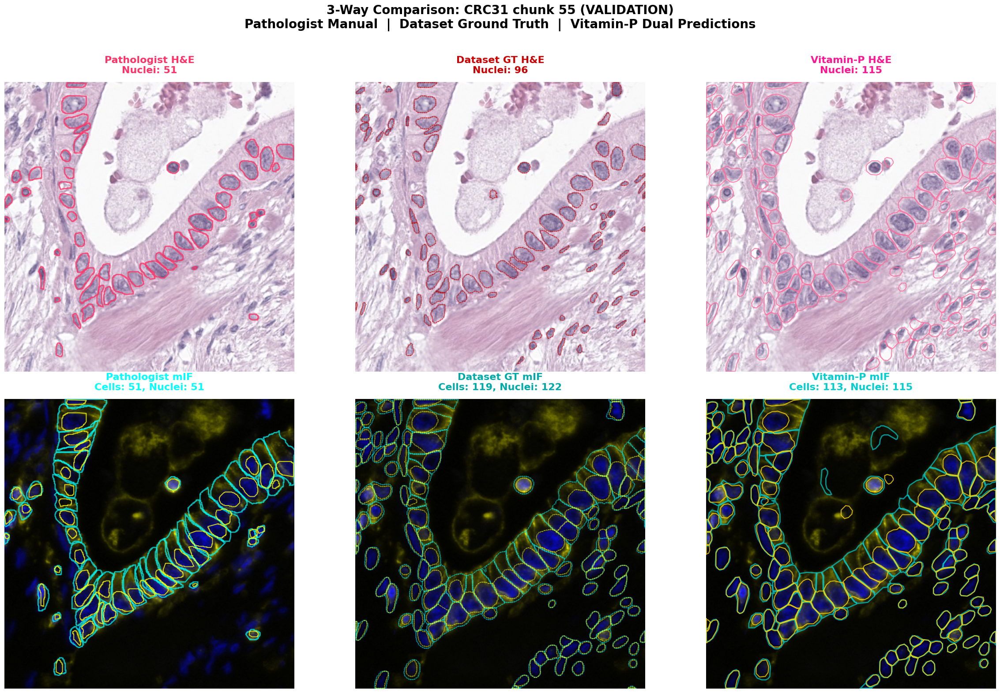


QUANTITATIVE COMPARISON
Metric                    Pathologist          Dataset GT           Vitamin-P           
----------------------------------------------------------------------------------------------------
H&E Nuclei                51                   96                   115                 
H&E Cells                 N/A                  119                  113                 
mIF Nuclei                51                   122                  115                 
mIF Cells                 51                   119                  113                 

DIFFERENCES FROM PATHOLOGIST:
Metric                    Dataset GT           Vitamin-P           
----------------------------------------------------------------------------------------------------
H&E Nuclei                +45 (+88.2%)     +64 (+125.5%)
mIF Cells                 +68 (+133.3%)     +62 (+121.6%)



In [9]:
"""
3-Way Comparison Visualization:
Row 1: H&E - Pathologist | Dataset GT | Vitamin-P
Row 2: mIF - Pathologist | Dataset GT | Vitamin-P

Shows both nuclei and cells for each method
All visualizations show boundary outlines for consistency
"""

import os
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from PIL import Image
import glob
import torch
from scipy import ndimage

# Paths
PATHOLOGIST_DIR = "/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Pathology_val"

def load_geojson(geojson_path):
    """Load GeoJSON file"""
    with open(geojson_path, 'r') as f:
        data = json.load(f)
    return data

def parse_pathologist_annotations(geojson_data):
    """Parse pathologist GeoJSON to extract cell and nuclei polygons"""
    cells = []
    nuclei = []
    
    if 'features' in geojson_data:
        for feature in geojson_data['features']:
            coords = feature['geometry']['coordinates']
            properties = feature.get('properties', {})
            
            classification = properties.get('classification', {})
            if isinstance(classification, dict):
                annotation_type = classification.get('name', '').lower()
            else:
                annotation_type = str(classification).lower()
            
            object_type = properties.get('objectType', '').lower()
            
            if 'cell' in annotation_type or 'cell' in object_type:
                cells.append(coords)
            elif 'detection' in object_type or 'nucleus' in annotation_type or 'nuclei' in annotation_type:
                nuclei.append(coords)
            else:
                nuclei.append(coords)
    
    return cells, nuclei

def parse_vitaminp_geojson(geojson_data):
    """Parse Vitamin-P GeoJSON output - handles Polygon geometry"""
    detections = []
    
    if 'features' in geojson_data:
        for feature in geojson_data['features']:
            if 'geometry' in feature:
                geom_type = feature['geometry'].get('type')
                coords = feature['geometry'].get('coordinates')
                
                # Handle different geometry types
                if geom_type == 'Polygon':
                    # Polygon format: [[[x1,y1], [x2,y2], ...]]
                    # We want the outer ring (first element)
                    if coords and len(coords) > 0:
                        detections.append(coords[0])  # coords[0] is the outer ring
                elif geom_type == 'MultiPolygon':
                    # MultiPolygon: [[[[x1,y1], [x2,y2], ...]], ...]
                    for polygon in coords:
                        if polygon and len(polygon) > 0:
                            detections.append(polygon[0])  # polygon[0] is outer ring
                else:
                    # Fallback for other formats
                    detections.append(coords)
    
    return detections

def find_matching_patch_in_dataset(case_name, chunk_num, dataset):
    """Find the matching patch in the dataset"""
    for idx, (sample, patch_idx) in enumerate(dataset.patch_info):
        if sample == case_name and patch_idx == chunk_num:
            return idx
    return None

def create_3way_comparison(sample_id, case_name, chunk_num, vitaminp_output_dir):
    """
    Create comprehensive 3-way comparison visualization
    
    Args:
        sample_id: Pathologist sample ID (1-20)
        case_name: Case name (e.g., 'CRC31')
        chunk_num: Chunk number
        vitaminp_output_dir: Directory with Vitamin-P predictions
    """
    
    print(f"\n{'='*80}")
    print(f"3-WAY COMPARISON: {case_name} chunk {chunk_num} (Sample {sample_id})")
    print(f"{'='*80}\n")
    
    # ========================================================================
    # 1. LOAD PATHOLOGIST ANNOTATIONS
    # ========================================================================
    pathologist_sample_dir = os.path.join(PATHOLOGIST_DIR, str(sample_id))
    
    image_extensions = ['.png', '.jpg', '.jpeg', '.tif', '.tiff']
    all_files = glob.glob(os.path.join(pathologist_sample_dir, "*"))
    
    he_images = [f for f in all_files 
                 if any(f.lower().endswith(ext) for ext in image_extensions)
                 and '-he' in f.lower() 
                 and 'mif' not in f.lower()]
    
    mif_images = [f for f in all_files 
                  if any(f.lower().endswith(ext) for ext in image_extensions)
                  and 'mif' in f.lower()]
    
    geojson_files = [f for f in all_files if f.endswith('.geojson')]
    
    # Load images and pathologist annotations
    he_img = Image.open(he_images[0])
    mif_img = Image.open(mif_images[0])
    path_geojson = load_geojson(geojson_files[0])
    path_cells, path_nuclei = parse_pathologist_annotations(path_geojson)
    
    print(f"✅ Pathologist annotations: {len(path_nuclei)} nuclei, {len(path_cells)} cells")
    
    # ========================================================================
    # 2. LOAD DATASET GROUND TRUTH
    # ========================================================================
    # Determine dataset split
    if case_name in train_loader.dataset.samples:
        dataset = train_loader.dataset
        split_name = "TRAIN"
    elif case_name in val_loader.dataset.samples:
        dataset = val_loader.dataset
        split_name = "VALIDATION"
    elif case_name in test_loader.dataset.samples:
        dataset = test_loader.dataset
        split_name = "TEST"
    else:
        print(f"❌ {case_name} not found in dataset!")
        return
    
    # Find matching patch
    patch_idx = find_matching_patch_in_dataset(case_name, chunk_num, dataset)
    if patch_idx is None:
        print(f"❌ Chunk {chunk_num} not found!")
        return
    
    dataset_sample = dataset[patch_idx]
    
    # Extract masks
    he_nuclei_mask = dataset_sample['he_nuclei_instance'].numpy()
    he_cell_mask = dataset_sample['he_cell_instance'].numpy()
    mif_nuclei_mask = dataset_sample['mif_nuclei_instance'].numpy()
    mif_cell_mask = dataset_sample['mif_cell_instance'].numpy()
    
    dataset_he_nuclei_count = len(np.unique(he_nuclei_mask)) - 1
    dataset_he_cell_count = len(np.unique(he_cell_mask)) - 1
    dataset_mif_nuclei_count = len(np.unique(mif_nuclei_mask)) - 1
    dataset_mif_cell_count = len(np.unique(mif_cell_mask)) - 1
    
    print(f"✅ Dataset GT: {dataset_he_nuclei_count} H&E nuclei, {dataset_he_cell_count} H&E cells, "
          f"{dataset_mif_nuclei_count} mIF nuclei, {dataset_mif_cell_count} mIF cells")
    
    # ========================================================================
    # 3. LOAD VITAMIN-P PREDICTIONS
    # ========================================================================
    # Use segmentation.geojson files which contain polygon boundaries
    # (detections.geojson only has centroids as Points)
    vitaminp_files = {
        'he_nuclei': os.path.join(vitaminp_output_dir, 'he_nuclei', 'nuclei_segmentation.geojson'),
        'he_cell': os.path.join(vitaminp_output_dir, 'he_cell', 'cell_segmentation.geojson'),
        'mif_nuclei': os.path.join(vitaminp_output_dir, 'mif_nuclei', 'nuclei_segmentation.geojson'),
        'mif_cell': os.path.join(vitaminp_output_dir, 'mif_cell', 'cell_segmentation.geojson')
    }
    
    vitaminp_predictions = {}
    for key, path in vitaminp_files.items():
        if os.path.exists(path):
            geojson = load_geojson(path)
            vitaminp_predictions[key] = parse_vitaminp_geojson(geojson)
            print(f"  ✓ Loaded {key}: {path} ({len(vitaminp_predictions[key])} polygons)")
        else:
            vitaminp_predictions[key] = []
            print(f"  ✗ Not found {key}: {path}")
    
    vp_he_nuclei_count = len(vitaminp_predictions['he_nuclei'])
    vp_he_cell_count = len(vitaminp_predictions['he_cell'])
    vp_mif_nuclei_count = len(vitaminp_predictions['mif_nuclei'])
    vp_mif_cell_count = len(vitaminp_predictions['mif_cell'])
    
    print(f"✅ Vitamin-P: {vp_he_nuclei_count} H&E nuclei, {vp_he_cell_count} H&E cells, "
          f"{vp_mif_nuclei_count} mIF nuclei, {vp_mif_cell_count} mIF cells")
    
    # ========================================================================
    # 4. CREATE VISUALIZATION
    # ========================================================================
    fig, axes = plt.subplots(2, 3, figsize=(24, 16))
    
    def draw_polygons(ax, img, polygons, color, linewidth=1.5, alpha=0.8):
        """Helper to draw polygon overlays"""
        ax.imshow(img)
        for coords in polygons:
            coords_array = coords
            while isinstance(coords_array, list) and len(coords_array) > 0 and isinstance(coords_array[0], list):
                if len(coords_array[0]) == 2 and isinstance(coords_array[0][0], (int, float)):
                    break
                coords_array = coords_array[0]
            if len(coords_array) > 2:
                poly = Polygon(coords_array, fill=False, edgecolor=color, linewidth=linewidth, alpha=alpha)
                ax.add_patch(poly)
        ax.axis('off')
    
    # ========================================================================
    # ROW 1: H&E
    # ========================================================================
    
    # Column 1: Pathologist
    draw_polygons(axes[0, 0], he_img, path_nuclei, '#FF3366', linewidth=2)
    axes[0, 0].set_title(f'Pathologist H&E\nNuclei: {len(path_nuclei)}', 
                         fontsize=16, fontweight='bold', color='#FF3366', pad=15)
    
    # Column 2: Dataset GT - extract and draw boundaries
    axes[0, 1].imshow(he_img)
    
    # Extract boundaries from instance mask
    from scipy import ndimage
    
    # For each unique nucleus instance, draw its boundary
    unique_instances = np.unique(he_nuclei_mask)
    for instance_id in unique_instances:
        if instance_id == 0:  # Skip background
            continue
        
        # Create binary mask for this instance
        instance_mask = (he_nuclei_mask == instance_id).astype(np.uint8)
        
        # Find contours/edges
        edges = instance_mask - ndimage.binary_erosion(instance_mask).astype(np.uint8)
        
        # Get boundary coordinates
        y_coords, x_coords = np.where(edges > 0)
        if len(x_coords) > 2:
            # Create a simple boundary visualization
            axes[0, 1].plot(x_coords, y_coords, 'o', color='#CC0000', markersize=0.5, alpha=0.6)
    
    axes[0, 1].set_title(f'Dataset GT H&E\nNuclei: {dataset_he_nuclei_count}', 
                         fontsize=16, fontweight='bold', color='#CC0000', pad=15)
    axes[0, 1].axis('off')
    
    # Column 3: Vitamin-P
    axes[0, 2].imshow(he_img)
    for coords in vitaminp_predictions['he_nuclei']:
        # coords should now be directly [[x1,y1], [x2,y2], ...] format
        if isinstance(coords, list) and len(coords) > 2:
            poly = Polygon(coords, fill=False, edgecolor='#FF6B9D', linewidth=1.5, alpha=0.8)
            axes[0, 2].add_patch(poly)
    axes[0, 2].set_title(f'Vitamin-P H&E\nNuclei: {vp_he_nuclei_count}', 
                         fontsize=16, fontweight='bold', color='#FF1493', pad=15)
    axes[0, 2].axis('off')
    
    # ========================================================================
    # ROW 2: mIF
    # ========================================================================
    
    # Column 1: Pathologist (cells + nuclei)
    axes[1, 0].imshow(mif_img)
    for cell_coords in path_cells:
        coords_array = cell_coords
        while isinstance(coords_array, list) and len(coords_array) > 0 and isinstance(coords_array[0], list):
            if len(coords_array[0]) == 2 and isinstance(coords_array[0][0], (int, float)):
                break
            coords_array = coords_array[0]
        if len(coords_array) > 2:
            poly = Polygon(coords_array, fill=False, edgecolor='#00FFFF', linewidth=2, alpha=0.7)
            axes[1, 0].add_patch(poly)
    
    for nucleus_coords in path_nuclei:
        coords_array = nucleus_coords
        while isinstance(coords_array, list) and len(coords_array) > 0 and isinstance(coords_array[0], list):
            if len(coords_array[0]) == 2 and isinstance(coords_array[0][0], (int, float)):
                break
            coords_array = coords_array[0]
        if len(coords_array) > 2:
            poly = Polygon(coords_array, fill=False, edgecolor='#FFFF00', linewidth=1.5, alpha=0.8)
            axes[1, 0].add_patch(poly)
    
    axes[1, 0].set_title(f'Pathologist mIF\nCells: {len(path_cells)}, Nuclei: {len(path_nuclei)}', 
                         fontsize=16, fontweight='bold', color='#00FFFF', pad=15)
    axes[1, 0].axis('off')
    
    # Column 2: Dataset GT (cells + nuclei) - show as boundaries
    axes[1, 1].imshow(mif_img)
    
    # Draw cell boundaries
    unique_cells = np.unique(mif_cell_mask)
    for instance_id in unique_cells:
        if instance_id == 0:
            continue
        instance_mask = (mif_cell_mask == instance_id).astype(np.uint8)
        edges = instance_mask - ndimage.binary_erosion(instance_mask).astype(np.uint8)
        y_coords, x_coords = np.where(edges > 0)
        if len(x_coords) > 2:
            axes[1, 1].plot(x_coords, y_coords, 'o', color='#00FFFF', markersize=0.5, alpha=0.5)
    
    # Draw nuclei boundaries
    unique_nuclei = np.unique(mif_nuclei_mask)
    for instance_id in unique_nuclei:
        if instance_id == 0:
            continue
        instance_mask = (mif_nuclei_mask == instance_id).astype(np.uint8)
        edges = instance_mask - ndimage.binary_erosion(instance_mask).astype(np.uint8)
        y_coords, x_coords = np.where(edges > 0)
        if len(x_coords) > 2:
            axes[1, 1].plot(x_coords, y_coords, 'o', color='#FFFF00', markersize=0.4, alpha=0.6)
    
    axes[1, 1].set_title(f'Dataset GT mIF\nCells: {dataset_mif_cell_count}, Nuclei: {dataset_mif_nuclei_count}', 
                         fontsize=16, fontweight='bold', color='#00AAAA', pad=15)
    axes[1, 1].axis('off')
    
    # Column 3: Vitamin-P (cells + nuclei)
    axes[1, 2].imshow(mif_img)
    
    # Draw cells
    for coords in vitaminp_predictions['mif_cell']:
        if isinstance(coords, list) and len(coords) > 2:
            poly = Polygon(coords, fill=False, edgecolor='#00CED1', linewidth=2, alpha=0.7)
            axes[1, 2].add_patch(poly)
    
    # Draw nuclei
    for coords in vitaminp_predictions['mif_nuclei']:
        if isinstance(coords, list) and len(coords) > 2:
            poly = Polygon(coords, fill=False, edgecolor='#FFD700', linewidth=1.5, alpha=0.8)
            axes[1, 2].add_patch(poly)
    
    axes[1, 2].set_title(f'Vitamin-P mIF\nCells: {vp_mif_cell_count}, Nuclei: {vp_mif_nuclei_count}', 
                         fontsize=16, fontweight='bold', color='#00CED1', pad=15)
    axes[1, 2].axis('off')
    
    # Main title
    plt.suptitle(f'3-Way Comparison: {case_name} chunk {chunk_num} ({split_name})\n'
                 f'Pathologist Manual  |  Dataset Ground Truth  |  Vitamin-P Dual Predictions', 
                 fontsize=20, fontweight='bold', y=0.98)
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
    
    # ========================================================================
    # PRINT SUMMARY TABLE
    # ========================================================================
    print(f"\n{'='*100}")
    print("QUANTITATIVE COMPARISON")
    print(f"{'='*100}")
    print(f"{'Metric':<25} {'Pathologist':<20} {'Dataset GT':<20} {'Vitamin-P':<20}")
    print("-"*100)
    print(f"{'H&E Nuclei':<25} {len(path_nuclei):<20} {dataset_he_nuclei_count:<20} {vp_he_nuclei_count:<20}")
    print(f"{'H&E Cells':<25} {'N/A':<20} {dataset_he_cell_count:<20} {vp_he_cell_count:<20}")
    print(f"{'mIF Nuclei':<25} {len(path_nuclei):<20} {dataset_mif_nuclei_count:<20} {vp_mif_nuclei_count:<20}")
    print(f"{'mIF Cells':<25} {len(path_cells):<20} {dataset_mif_cell_count:<20} {vp_mif_cell_count:<20}")
    print(f"{'='*100}")
    
    # Calculate differences
    print("\nDIFFERENCES FROM PATHOLOGIST:")
    print(f"{'='*100}")
    print(f"{'Metric':<25} {'Dataset GT':<20} {'Vitamin-P':<20}")
    print("-"*100)
    print(f"{'H&E Nuclei':<25} {dataset_he_nuclei_count - len(path_nuclei):+d} ({(dataset_he_nuclei_count/len(path_nuclei)*100-100):+.1f}%)"
          f"{'':>4} {vp_he_nuclei_count - len(path_nuclei):+d} ({(vp_he_nuclei_count/len(path_nuclei)*100-100):+.1f}%)")
    print(f"{'mIF Cells':<25} {dataset_mif_cell_count - len(path_cells):+d} ({(dataset_mif_cell_count/len(path_cells)*100-100):+.1f}%)"
          f"{'':>4} {vp_mif_cell_count - len(path_cells):+d} ({(vp_mif_cell_count/len(path_cells)*100-100):+.1f}%)")
    print(f"{'='*100}\n")

# Run the 3-way comparison
SAMPLE_ID = 1
CASE_NAME = 'CRC31'
CHUNK_NUM = 55
VITAMINP_OUTPUT = 'results_pathologist_sample_1'

create_3way_comparison(SAMPLE_ID, CASE_NAME, CHUNK_NUM, VITAMINP_OUTPUT)

## whole data

In [14]:
"""
Run Vitamin-P Dual model on all 20 pathologist-validated samples
Save results to results_pathologist_public/{sample_id}/
"""

import os
import glob
from tqdm import tqdm

# Configuration
PATHOLOGIST_DIR = "/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Pathology_val"
OUTPUT_BASE_DIR = "results_pathologist_public"

# Create output directory
os.makedirs(OUTPUT_BASE_DIR, exist_ok=True)

def get_pathologist_sample_info(sample_id):
    """Get file paths and metadata for a pathologist sample"""
    sample_dir = os.path.join(PATHOLOGIST_DIR, str(sample_id))
    
    if not os.path.exists(sample_dir):
        return None
    
    # Find files
    image_extensions = ['.png', '.jpg', '.jpeg', '.tif', '.tiff']
    all_files = glob.glob(os.path.join(sample_dir, "*"))
    
    he_images = [f for f in all_files 
                 if any(f.lower().endswith(ext) for ext in image_extensions)
                 and '-he' in f.lower() 
                 and 'mif' not in f.lower()]
    
    mif_images = [f for f in all_files 
                  if any(f.lower().endswith(ext) for ext in image_extensions)
                  and 'mif' in f.lower()]
    
    geojson_files = [f for f in all_files if f.endswith('.geojson')]
    
    if not he_images or not mif_images:
        return None
    
    # Extract case name and chunk from filename
    import re
    he_filename = os.path.basename(he_images[0])
    match = re.match(r'(.+?)-he_chunk_(\d+)', he_filename)
    
    if match:
        case_name = match.group(1)
        chunk_number = match.group(2)
    else:
        case_name = "unknown"
        chunk_number = "unknown"
    
    return {
        'sample_id': sample_id,
        'case_name': case_name,
        'chunk_number': chunk_number,
        'he_path': he_images[0],
        'mif_path': mif_images[0],
        'geojson_path': geojson_files[0] if geojson_files else None,
        'he_filename': os.path.basename(he_images[0]),
        'mif_filename': os.path.basename(mif_images[0])
    }

# MIF channel configuration
config = ChannelConfig(
    nuclear_channel=2,      # DAPI is in channel 2 (Blue)
    membrane_channel=[0, 1], # Cell markers in channels 0 and 1 (Red + Green)
    membrane_combination='max',
    channel_names={0: 'CellMarker1', 1: 'CellMarker2', 2: 'DAPI'}
)

# Initialize predictor
predictor = WSIPredictor(
    model=model,
    device='cuda',
    patch_size=512,
    overlap=64,
    target_mpp=0.263,
    magnification=40,
    mif_channel_config=config,
)

print("="*100)
print("RUNNING VITAMIN-P DUAL ON ALL 20 PATHOLOGIST-VALIDATED SAMPLES")
print("="*100)

# Collect all sample info
all_samples = []
for sample_id in range(1, 21):
    info = get_pathologist_sample_info(sample_id)
    if info:
        all_samples.append(info)

print(f"\nFound {len(all_samples)} valid samples")
print(f"Output directory: {OUTPUT_BASE_DIR}/\n")

# Run inference on all samples
results_summary = []

for sample_info in tqdm(all_samples, desc="Processing samples"):
    sample_id = sample_info['sample_id']
    case_name = sample_info['case_name']
    chunk_num = sample_info['chunk_number']
    
    # Create output directory for this sample
    output_dir = os.path.join(OUTPUT_BASE_DIR, f"sample_{sample_id:02d}")
    
    print(f"\n{'='*100}")
    print(f"Sample {sample_id:02d}: {case_name} chunk {chunk_num}")
    print(f"  H&E:  {sample_info['he_filename']}")
    print(f"  mIF:  {sample_info['mif_filename']}")
    print(f"  Output: {output_dir}")
    
    try:
        # Run prediction
        results = predictor.predict(
            wsi_path=sample_info['he_path'],
            wsi_path_mif=sample_info['mif_path'],
            output_dir=output_dir,
            branches=['he_nuclei', 'he_cell', 'mif_nuclei', 'mif_cell'],
            filter_tissue=True,
            clean_overlaps=True,
            save_geojson=True,
            save_visualization=True,
            detection_threshold=0.3,
            min_area_um=10.0,
        )
        
        # Store results
        results_summary.append({
            'sample_id': sample_id,
            'case_name': case_name,
            'chunk_number': chunk_num,
            'he_nuclei': results['he_nuclei']['num_detections'],
            'he_cells': results['he_cell']['num_detections'],
            'mif_nuclei': results['mif_nuclei']['num_detections'],
            'mif_cells': results['mif_cell']['num_detections'],
            'status': 'success',
            'output_dir': output_dir
        })
        
        print(f"  ✅ Success: {results['he_nuclei']['num_detections']} H&E nuclei, "
              f"{results['he_cell']['num_detections']} H&E cells, "
              f"{results['mif_nuclei']['num_detections']} mIF nuclei, "
              f"{results['mif_cell']['num_detections']} mIF cells")
        
    except Exception as e:
        print(f"  ❌ Error: {str(e)}")
        results_summary.append({
            'sample_id': sample_id,
            'case_name': case_name,
            'chunk_number': chunk_num,
            'he_nuclei': 0,
            'he_cells': 0,
            'mif_nuclei': 0,
            'mif_cells': 0,
            'status': 'failed',
            'error': str(e),
            'output_dir': output_dir
        })

# Print summary
print("\n" + "="*100)
print("INFERENCE COMPLETE - SUMMARY")
print("="*100)

successful = sum(1 for r in results_summary if r['status'] == 'success')
failed = sum(1 for r in results_summary if r['status'] == 'failed')

print(f"\nTotal samples processed: {len(results_summary)}")
print(f"  ✅ Successful: {successful}")
print(f"  ❌ Failed: {failed}")

print("\n" + "="*100)
print("RESULTS BY SAMPLE")
print("="*100)
print(f"{'ID':<4} {'Case':<15} {'Chunk':<6} {'H&E Nuclei':<12} {'H&E Cells':<12} {'mIF Nuclei':<12} {'mIF Cells':<12} {'Status':<10}")
print("-"*100)

for r in results_summary:
    status_symbol = "✅" if r['status'] == 'success' else "❌"
    print(f"{r['sample_id']:<4} {r['case_name']:<15} {r['chunk_number']:<6} "
          f"{r['he_nuclei']:<12} {r['he_cells']:<12} {r['mif_nuclei']:<12} {r['mif_cells']:<12} "
          f"{status_symbol} {r['status']:<10}")

print("="*100)

# Save summary to JSON
import json
summary_file = os.path.join(OUTPUT_BASE_DIR, 'inference_summary.json')
with open(summary_file, 'w') as f:
    json.dump(results_summary, f, indent=2)

print(f"\n✅ Summary saved to: {summary_file}")
print(f"✅ All results saved to: {OUTPUT_BASE_DIR}/")
print("\n💡 Next step: Run the metrics computation and visualization code!")
print("="*100)

# Make results_summary available for next cell
print(f"\n📊 Variable 'results_summary' is ready for metrics computation")

2026-01-31 16:36:26 - WSIPredictor - INFO - WSIPredictor initialized:
2026-01-31 16:36:26 - WSIPredictor - INFO -   Device: cuda
2026-01-31 16:36:26 - WSIPredictor - INFO -   Model type: VitaminPDual (dual-modality)
2026-01-31 16:36:26 - WSIPredictor - INFO -   Patch size: 512
2026-01-31 16:36:26 - WSIPredictor - INFO -   Overlap: 64
2026-01-31 16:36:26 - WSIPredictor - INFO -   Magnification: 40
2026-01-31 16:36:26 - WSIPredictor - INFO -   MIF channels: Nuclear: DAPI, Membrane: max(CellMarker1, CellMarker2)


RUNNING VITAMIN-P DUAL ON ALL 20 PATHOLOGIST-VALIDATED SAMPLES

Found 20 valid samples
Output directory: results_pathologist_public/



Processing samples:   0%|          | 0/20 [00:00<?, ?it/s]2026-01-31 16:36:26 - WSIPredictor - INFO - 
2026-01-31 16:36:26 - WSIPredictor - INFO - Processing branch: he_nuclei
2026-01-31 16:36:26 - WSIPredictor - INFO - ============================================================
2026-01-31 16:36:26 - WSIPredictor - INFO - 🔄 Using MIF predictions for he_nuclei (better quality)
2026-01-31 16:36:26 - WSIPredictor - INFO -    ⚠ No MPP in metadata, using default: 0.2630 μm/px
2026-01-31 16:36:26 - WSIPredictor - INFO - 🔍 Resolution matching:
2026-01-31 16:36:26 - WSIPredictor - INFO -    WSI MPP: 0.2630 μm/px
2026-01-31 16:36:26 - WSIPredictor - INFO -    Model training MPP: 0.2630 μm/px
2026-01-31 16:36:26 - WSIPredictor - INFO -    Scale factor: 1.00x
2026-01-31 16:36:26 - WSIPredictor - INFO -    Min area filter: 10.0 μm² = 145 pixels²
2026-01-31 16:36:26 - WSIPredictor - INFO - 📁 Opening dual WSI pair:
2026-01-31 16:36:26 - WSIPredictor - INFO -    H&E: /rsrch9/home/plm/idso_fa1_pathol


Sample 01: CRC31 chunk 55
  H&E:  CRC31-he_chunk_55.png
  mIF:  CRC31-mif_chunk_55_combined.png
  Output: results_pathologist_public/sample_01
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2026-01-31 16:36:26 - WSIPredictor - INFO -    ✓ Extracted 105 instances from tiles (before cleaning)
2026-01-31 16:36:26 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:26 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:26 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:26 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:26 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 47
2026-01-31 16:36:26 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 44.8%
2026-01-31 16:36:26 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:26 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 105
2026-01-31 16:36:26 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:26 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]
2026-01-31 16:36:27 - WSIPredictor - INFO -    ✓ Extracted 106 instances from tiles (before cleaning)
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:27 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:27 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:27 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 48
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 45.3%
2026-01-31 16:36:27 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 106
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]
2026-01-31 16:36:27 - WSIPredictor - INFO -    ✓ Extracted 105 instances from tiles (before cleaning)
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:27 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:27 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:27 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 47
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 44.8%
2026-01-31 16:36:27 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 105
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]
2026-01-31 16:36:27 - WSIPredictor - INFO -    ✓ Extracted 106 instances from tiles (before cleaning)
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:27 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:27 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:27 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 48
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 45.3%
2026-01-31 16:36:27 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 106
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:27 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 105 H&E nuclei, 106 H&E cells, 105 mIF nuclei, 106 mIF cells

Sample 02: CRC31 chunk 45
  H&E:  CRC31-he_chunk_45.png
  mIF:  CRC31-mif_chunk_45_combined.png
  Output: results_pathologist_public/sample_02
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]
2026-01-31 16:36:28 - WSIPredictor - INFO -    ✓ Extracted 123 instances from tiles (before cleaning)
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:28 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:28 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:28 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 53
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 43.1%
2026-01-31 16:36:28 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 123
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]
2026-01-31 16:36:28 - WSIPredictor - INFO -    ✓ Extracted 126 instances from tiles (before cleaning)
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:28 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:28 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:28 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 53
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 42.1%
2026-01-31 16:36:28 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 126
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]
2026-01-31 16:36:28 - WSIPredictor - INFO -    ✓ Extracted 123 instances from tiles (before cleaning)
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:28 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:28 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:28 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 53
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 43.1%
2026-01-31 16:36:28 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 123
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:28 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]
2026-01-31 16:36:29 - WSIPredictor - INFO -    ✓ Extracted 126 instances from tiles (before cleaning)
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:29 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:29 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:29 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 53
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 42.1%
2026-01-31 16:36:29 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 126
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 123 H&E nuclei, 126 H&E cells, 123 mIF nuclei, 126 mIF cells

Sample 03: CRC28 chunk 59
  H&E:  CRC28-he_chunk_59.png
  mIF:  CRC28-mif_chunk_59_combined.png
  Output: results_pathologist_public/sample_03
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]
2026-01-31 16:36:29 - WSIPredictor - INFO -    ✓ Extracted 187 instances from tiles (before cleaning)
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:29 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:29 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:29 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 88
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 47.1%
2026-01-31 16:36:29 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 187
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]
2026-01-31 16:36:29 - WSIPredictor - INFO -    ✓ Extracted 183 instances from tiles (before cleaning)
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:29 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:29 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:29 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 87
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 47.5%
2026-01-31 16:36:29 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 183
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:29 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]
2026-01-31 16:36:30 - WSIPredictor - INFO -    ✓ Extracted 187 instances from tiles (before cleaning)
2026-01-31 16:36:30 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:30 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:30 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:30 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:30 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 88
2026-01-31 16:36:30 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 47.1%
2026-01-31 16:36:30 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:30 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 187
2026-01-31 16:36:30 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:30 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]
2026-01-31 16:36:30 - WSIPredictor - INFO -    ✓ Extracted 183 instances from tiles (before cleaning)
2026-01-31 16:36:30 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:30 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:30 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:30 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:30 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 87
2026-01-31 16:36:30 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 47.5%
2026-01-31 16:36:30 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:30 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 183
2026-01-31 16:36:30 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:30 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 187 H&E nuclei, 183 H&E cells, 187 mIF nuclei, 183 mIF cells

Sample 04: CRC28 chunk 30
  H&E:  CRC28-he_chunk_30.png
  mIF:  CRC28-mif_chunk_30_combined.png
  Output: results_pathologist_public/sample_04
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.08it/s]
2026-01-31 16:36:31 - WSIPredictor - INFO -    ✓ Extracted 223 instances from tiles (before cleaning)
2026-01-31 16:36:31 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:31 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:31 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:31 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:31 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 94
2026-01-31 16:36:31 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 42.2%
2026-01-31 16:36:31 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:31 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 223
2026-01-31 16:36:31 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:31 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  3.94it/s]
2026-01-31 16:36:31 - WSIPredictor - INFO -    ✓ Extracted 223 instances from tiles (before cleaning)
2026-01-31 16:36:31 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:31 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:31 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:31 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:31 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 94
2026-01-31 16:36:31 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 42.2%
2026-01-31 16:36:31 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:31 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 223
2026-01-31 16:36:31 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:31 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.01it/s]
2026-01-31 16:36:32 - WSIPredictor - INFO -    ✓ Extracted 223 instances from tiles (before cleaning)
2026-01-31 16:36:32 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:32 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:32 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:32 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:32 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 94
2026-01-31 16:36:32 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 42.2%
2026-01-31 16:36:32 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:32 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 223
2026-01-31 16:36:32 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:32 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.08it/s]
2026-01-31 16:36:32 - WSIPredictor - INFO -    ✓ Extracted 223 instances from tiles (before cleaning)
2026-01-31 16:36:32 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:32 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:32 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:32 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:32 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 94
2026-01-31 16:36:32 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 42.2%
2026-01-31 16:36:32 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:32 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 223
2026-01-31 16:36:32 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:32 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 223 H&E nuclei, 223 H&E cells, 223 mIF nuclei, 223 mIF cells

Sample 05: CRC28 chunk 58
  H&E:  CRC28-he_chunk_58.png
  mIF:  CRC28-mif_chunk_58_combined.png
  Output: results_pathologist_public/sample_05
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  3.46it/s]
2026-01-31 16:36:33 - WSIPredictor - INFO -    ✓ Extracted 259 instances from tiles (before cleaning)
2026-01-31 16:36:33 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:33 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:33 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:33 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:33 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 105
2026-01-31 16:36:33 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 40.5%
2026-01-31 16:36:33 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:33 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 259
2026-01-31 16:36:33 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:33 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  3.39it/s]
2026-01-31 16:36:33 - WSIPredictor - INFO -    ✓ Extracted 271 instances from tiles (before cleaning)
2026-01-31 16:36:33 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:33 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:33 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:33 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:33 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 120
2026-01-31 16:36:33 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 44.3%
2026-01-31 16:36:33 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:33 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 271
2026-01-31 16:36:33 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:33 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]
2026-01-31 16:36:34 - WSIPredictor - INFO -    ✓ Extracted 259 instances from tiles (before cleaning)
2026-01-31 16:36:34 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:34 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:34 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:34 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:34 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 105
2026-01-31 16:36:34 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 40.5%
2026-01-31 16:36:34 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:34 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 259
2026-01-31 16:36:34 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:34 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  3.39it/s]
2026-01-31 16:36:35 - WSIPredictor - INFO -    ✓ Extracted 271 instances from tiles (before cleaning)
2026-01-31 16:36:35 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:35 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:35 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:35 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:35 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 120
2026-01-31 16:36:35 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 44.3%
2026-01-31 16:36:35 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:35 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 271
2026-01-31 16:36:35 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:35 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 259 H&E nuclei, 271 H&E cells, 259 mIF nuclei, 271 mIF cells

Sample 06: breast chunk 49
  H&E:  breast-he_chunk_49.png
  mIF:  breast-mif_chunk_49_combined.png
  Output: results_pathologist_public/sample_06
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]
2026-01-31 16:36:35 - WSIPredictor - INFO -    ✓ Extracted 92 instances from tiles (before cleaning)
2026-01-31 16:36:35 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:35 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:35 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:35 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:35 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 46
2026-01-31 16:36:35 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 50.0%
2026-01-31 16:36:35 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:35 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 92
2026-01-31 16:36:35 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:35 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]
2026-01-31 16:36:36 - WSIPredictor - INFO -    ✓ Extracted 86 instances from tiles (before cleaning)
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:36 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:36 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:36 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 46
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 53.5%
2026-01-31 16:36:36 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 86
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2026-01-31 16:36:36 - WSIPredictor - INFO -    ✓ Extracted 92 instances from tiles (before cleaning)
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:36 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:36 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:36 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 46
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 50.0%
2026-01-31 16:36:36 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 92
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]
2026-01-31 16:36:36 - WSIPredictor - INFO -    ✓ Extracted 86 instances from tiles (before cleaning)
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:36 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:36 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:36 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 46
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 53.5%
2026-01-31 16:36:36 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 86
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:36 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 92 H&E nuclei, 86 H&E cells, 92 mIF nuclei, 86 mIF cells

Sample 07: breast chunk 79
  H&E:  breast-he_chunk_79.png
  mIF:  breast-mif_chunk_79_combined.png
  Output: results_pathologist_public/sample_07
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.74it/s]
2026-01-31 16:36:37 - WSIPredictor - INFO -    ✓ Extracted 77 instances from tiles (before cleaning)
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:37 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:37 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:37 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 39
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 50.6%
2026-01-31 16:36:37 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 77
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.78it/s]
2026-01-31 16:36:37 - WSIPredictor - INFO -    ✓ Extracted 64 instances from tiles (before cleaning)
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:37 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:37 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:37 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 34
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 53.1%
2026-01-31 16:36:37 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 64
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  7.04it/s]
2026-01-31 16:36:37 - WSIPredictor - INFO -    ✓ Extracted 77 instances from tiles (before cleaning)
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:37 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:37 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:37 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 39
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 50.6%
2026-01-31 16:36:37 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 77
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.94it/s]
2026-01-31 16:36:37 - WSIPredictor - INFO -    ✓ Extracted 64 instances from tiles (before cleaning)
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:37 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:37 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:37 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 34
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 53.1%
2026-01-31 16:36:37 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 64
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:37 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 77 H&E nuclei, 64 H&E cells, 77 mIF nuclei, 64 mIF cells

Sample 08: breast chunk 63
  H&E:  breast-he_chunk_63.png
  mIF:  breast-mif_chunk_63_combined.png
  Output: results_pathologist_public/sample_08
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.65it/s]
2026-01-31 16:36:38 - WSIPredictor - INFO -    ✓ Extracted 87 instances from tiles (before cleaning)
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:38 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:38 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:38 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 45
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 51.7%
2026-01-31 16:36:38 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 87
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]
2026-01-31 16:36:38 - WSIPredictor - INFO -    ✓ Extracted 66 instances from tiles (before cleaning)
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:38 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:38 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:38 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 34
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 51.5%
2026-01-31 16:36:38 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 66
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.50it/s]
2026-01-31 16:36:38 - WSIPredictor - INFO -    ✓ Extracted 87 instances from tiles (before cleaning)
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:38 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:38 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:38 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 45
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 51.7%
2026-01-31 16:36:38 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 87
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:38 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]
2026-01-31 16:36:39 - WSIPredictor - INFO -    ✓ Extracted 66 instances from tiles (before cleaning)
2026-01-31 16:36:39 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:39 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:39 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:39 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:39 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 34
2026-01-31 16:36:39 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 51.5%
2026-01-31 16:36:39 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:39 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 66
2026-01-31 16:36:39 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:39 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 87 H&E nuclei, 66 H&E cells, 87 mIF nuclei, 66 mIF cells

Sample 09: cervical chunk 53
  H&E:  cervical-he_chunk_53.png
  mIF:  cervical-mif_chunk_53_combined.png
  Output: results_pathologist_public/sample_09
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]
2026-01-31 16:36:39 - WSIPredictor - INFO -    ✓ Extracted 130 instances from tiles (before cleaning)
2026-01-31 16:36:39 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:39 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:39 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:39 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:39 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 63
2026-01-31 16:36:39 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 48.5%
2026-01-31 16:36:39 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:39 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 130
2026-01-31 16:36:39 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:39 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]
2026-01-31 16:36:40 - WSIPredictor - INFO -    ✓ Extracted 126 instances from tiles (before cleaning)
2026-01-31 16:36:40 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:40 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:40 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:40 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:40 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 58
2026-01-31 16:36:40 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 46.0%
2026-01-31 16:36:40 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:40 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 126
2026-01-31 16:36:40 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:40 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]
2026-01-31 16:36:40 - WSIPredictor - INFO -    ✓ Extracted 130 instances from tiles (before cleaning)
2026-01-31 16:36:40 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:40 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:40 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:40 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:40 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 63
2026-01-31 16:36:40 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 48.5%
2026-01-31 16:36:40 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:40 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 130
2026-01-31 16:36:40 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:40 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]
2026-01-31 16:36:41 - WSIPredictor - INFO -    ✓ Extracted 126 instances from tiles (before cleaning)
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:41 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:41 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:41 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 58
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 46.0%
2026-01-31 16:36:41 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 126
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 130 H&E nuclei, 126 H&E cells, 130 mIF nuclei, 126 mIF cells

Sample 10: cervical chunk 25
  H&E:  cervical-he_chunk_25.png
  mIF:  cervical-mif_chunk_25_combined.png
  Output: results_pathologist_public/sample_10
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]
2026-01-31 16:36:41 - WSIPredictor - INFO -    ✓ Extracted 195 instances from tiles (before cleaning)
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:41 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:41 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:41 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 93
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 47.7%
2026-01-31 16:36:41 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 195
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]
2026-01-31 16:36:41 - WSIPredictor - INFO -    ✓ Extracted 183 instances from tiles (before cleaning)
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:41 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:41 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:41 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 90
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 49.2%
2026-01-31 16:36:41 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 183
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:41 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]
2026-01-31 16:36:42 - WSIPredictor - INFO -    ✓ Extracted 195 instances from tiles (before cleaning)
2026-01-31 16:36:42 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:42 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:42 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:42 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:42 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 93
2026-01-31 16:36:42 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 47.7%
2026-01-31 16:36:42 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:42 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 195
2026-01-31 16:36:42 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:42 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]
2026-01-31 16:36:42 - WSIPredictor - INFO -    ✓ Extracted 183 instances from tiles (before cleaning)
2026-01-31 16:36:42 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:42 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:42 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:42 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:42 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 90
2026-01-31 16:36:42 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 49.2%
2026-01-31 16:36:42 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:42 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 183
2026-01-31 16:36:42 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:42 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 195 H&E nuclei, 183 H&E cells, 195 mIF nuclei, 183 mIF cells

Sample 11: cervical chunk 9
  H&E:  cervical-he_chunk_9.png
  mIF:  cervical-mif_chunk_9_combined.png
  Output: results_pathologist_public/sample_11
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]
2026-01-31 16:36:43 - WSIPredictor - INFO -    ✓ Extracted 142 instances from tiles (before cleaning)
2026-01-31 16:36:43 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:43 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:43 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:43 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:43 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 65
2026-01-31 16:36:43 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 45.8%
2026-01-31 16:36:43 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:43 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 142
2026-01-31 16:36:43 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:43 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]
2026-01-31 16:36:43 - WSIPredictor - INFO -    ✓ Extracted 136 instances from tiles (before cleaning)
2026-01-31 16:36:43 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:43 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:43 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:43 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:43 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 63
2026-01-31 16:36:43 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 46.3%
2026-01-31 16:36:43 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:43 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 136
2026-01-31 16:36:43 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:43 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]
2026-01-31 16:36:44 - WSIPredictor - INFO -    ✓ Extracted 142 instances from tiles (before cleaning)
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:44 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:44 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:44 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 65
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 45.8%
2026-01-31 16:36:44 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 142
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]
2026-01-31 16:36:44 - WSIPredictor - INFO -    ✓ Extracted 136 instances from tiles (before cleaning)
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:44 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:44 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:44 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 63
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 46.3%
2026-01-31 16:36:44 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 136
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 142 H&E nuclei, 136 H&E cells, 142 mIF nuclei, 136 mIF cells

Sample 12: lung chunk 29
  H&E:  lung-he_chunk_29.png
  mIF:  lung-mif_chunk_29_combined.png
  Output: results_pathologist_public/sample_12
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]
2026-01-31 16:36:44 - WSIPredictor - INFO -    ✓ Extracted 112 instances from tiles (before cleaning)
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:44 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:44 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:44 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 50
2026-01-31 16:36:44 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 44.6%
2026-01-31 16:36:45 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 112
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2026-01-31 16:36:45 - WSIPredictor - INFO -    ✓ Extracted 112 instances from tiles (before cleaning)
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:45 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:45 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:45 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 49
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 43.8%
2026-01-31 16:36:45 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 112
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]
2026-01-31 16:36:45 - WSIPredictor - INFO -    ✓ Extracted 112 instances from tiles (before cleaning)
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:45 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:45 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:45 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 50
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 44.6%
2026-01-31 16:36:45 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 112
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:45 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]
2026-01-31 16:36:46 - WSIPredictor - INFO -    ✓ Extracted 112 instances from tiles (before cleaning)
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:46 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:46 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:46 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 49
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 43.8%
2026-01-31 16:36:46 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 112
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 112 H&E nuclei, 112 H&E cells, 112 mIF nuclei, 112 mIF cells

Sample 13: lung chunk 49
  H&E:  lung-he_chunk_49.png
  mIF:  lung-mif_chunk_49_combined.png
  Output: results_pathologist_public/sample_13
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  7.55it/s]
2026-01-31 16:36:46 - WSIPredictor - INFO -    ✓ Extracted 69 instances from tiles (before cleaning)
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:46 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:46 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:46 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 37
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 53.6%
2026-01-31 16:36:46 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 69
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  7.01it/s]
2026-01-31 16:36:46 - WSIPredictor - INFO -    ✓ Extracted 65 instances from tiles (before cleaning)
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:46 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:46 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:46 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 36
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 55.4%
2026-01-31 16:36:46 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 65
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.97it/s]
2026-01-31 16:36:46 - WSIPredictor - INFO -    ✓ Extracted 69 instances from tiles (before cleaning)
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:46 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:46 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:46 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 37
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 53.6%
2026-01-31 16:36:46 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 69
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:46 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  7.23it/s]
2026-01-31 16:36:47 - WSIPredictor - INFO -    ✓ Extracted 65 instances from tiles (before cleaning)
2026-01-31 16:36:47 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:47 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:47 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:47 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:47 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 36
2026-01-31 16:36:47 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 55.4%
2026-01-31 16:36:47 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:47 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 65
2026-01-31 16:36:47 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:47 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 69 H&E nuclei, 65 H&E cells, 69 mIF nuclei, 65 mIF cells

Sample 14: ovarian chunk 1
  H&E:  ovarian-he_chunk_1.png
  mIF:  ovarian-mif_chunk_1_combined.png
  Output: results_pathologist_public/sample_14
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]
2026-01-31 16:36:47 - WSIPredictor - INFO -    ✓ Extracted 138 instances from tiles (before cleaning)
2026-01-31 16:36:47 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:47 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:47 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:47 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:47 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 52
2026-01-31 16:36:47 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 37.7%
2026-01-31 16:36:47 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:47 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 138
2026-01-31 16:36:47 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:47 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]
2026-01-31 16:36:48 - WSIPredictor - INFO -    ✓ Extracted 136 instances from tiles (before cleaning)
2026-01-31 16:36:48 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:48 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:48 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:48 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:48 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 54
2026-01-31 16:36:48 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 39.7%
2026-01-31 16:36:48 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:48 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 136
2026-01-31 16:36:48 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:48 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]
2026-01-31 16:36:48 - WSIPredictor - INFO -    ✓ Extracted 138 instances from tiles (before cleaning)
2026-01-31 16:36:48 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:48 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:48 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:48 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:48 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 52
2026-01-31 16:36:48 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 37.7%
2026-01-31 16:36:48 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:48 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 138
2026-01-31 16:36:48 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:48 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]
2026-01-31 16:36:49 - WSIPredictor - INFO -    ✓ Extracted 136 instances from tiles (before cleaning)
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:49 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:49 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:49 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 54
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 39.7%
2026-01-31 16:36:49 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 136
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 138 H&E nuclei, 136 H&E cells, 138 mIF nuclei, 136 mIF cells

Sample 15: ovarian chunk 4
  H&E:  ovarian-he_chunk_4.png
  mIF:  ovarian-mif_chunk_4_combined.png
  Output: results_pathologist_public/sample_15
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]
2026-01-31 16:36:49 - WSIPredictor - INFO -    ✓ Extracted 116 instances from tiles (before cleaning)
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:49 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:49 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:49 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 61
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 52.6%
2026-01-31 16:36:49 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 116
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]
2026-01-31 16:36:49 - WSIPredictor - INFO -    ✓ Extracted 104 instances from tiles (before cleaning)
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:49 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:49 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:49 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 57
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 54.8%
2026-01-31 16:36:49 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 104
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:49 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]
2026-01-31 16:36:50 - WSIPredictor - INFO -    ✓ Extracted 116 instances from tiles (before cleaning)
2026-01-31 16:36:50 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:50 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:50 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:50 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:50 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 61
2026-01-31 16:36:50 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 52.6%
2026-01-31 16:36:50 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:50 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 116
2026-01-31 16:36:50 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:50 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]
2026-01-31 16:36:50 - WSIPredictor - INFO -    ✓ Extracted 104 instances from tiles (before cleaning)
2026-01-31 16:36:50 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:50 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:50 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:50 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:50 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 57
2026-01-31 16:36:50 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 54.8%
2026-01-31 16:36:50 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:50 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 104
2026-01-31 16:36:50 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:50 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 116 H&E nuclei, 104 H&E cells, 116 mIF nuclei, 104 mIF cells

Sample 16: ovarian chunk 79
  H&E:  ovarian-he_chunk_79.png
  mIF:  ovarian-mif_chunk_79_combined.png
  Output: results_pathologist_public/sample_16
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]
2026-01-31 16:36:51 - WSIPredictor - INFO -    ✓ Extracted 223 instances from tiles (before cleaning)
2026-01-31 16:36:51 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:51 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:51 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:51 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:51 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 105
2026-01-31 16:36:51 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 47.1%
2026-01-31 16:36:51 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:51 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 223
2026-01-31 16:36:51 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:51 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]
2026-01-31 16:36:51 - WSIPredictor - INFO -    ✓ Extracted 218 instances from tiles (before cleaning)
2026-01-31 16:36:51 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:51 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:51 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:51 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:51 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 100
2026-01-31 16:36:51 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 45.9%
2026-01-31 16:36:51 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:51 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 218
2026-01-31 16:36:51 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:51 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]
2026-01-31 16:36:52 - WSIPredictor - INFO -    ✓ Extracted 223 instances from tiles (before cleaning)
2026-01-31 16:36:52 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:52 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:52 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:52 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:52 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 105
2026-01-31 16:36:52 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 47.1%
2026-01-31 16:36:52 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:52 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 223
2026-01-31 16:36:52 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:52 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]
2026-01-31 16:36:52 - WSIPredictor - INFO -    ✓ Extracted 218 instances from tiles (before cleaning)
2026-01-31 16:36:52 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:52 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:52 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:52 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:52 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 100
2026-01-31 16:36:52 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 45.9%
2026-01-31 16:36:52 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:52 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 218
2026-01-31 16:36:52 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:52 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 223 H&E nuclei, 218 H&E cells, 223 mIF nuclei, 218 mIF cells

Sample 17: prostate chunk 95
  H&E:  prostate-he_chunk_95.png
  mIF:  prostate-mif_chunk_95_combined.png
  Output: results_pathologist_public/sample_17
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  7.63it/s]
2026-01-31 16:36:53 - WSIPredictor - INFO -    ✓ Extracted 68 instances from tiles (before cleaning)
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:53 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:53 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:53 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 34
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 50.0%
2026-01-31 16:36:53 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 68
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  6.72it/s]
2026-01-31 16:36:53 - WSIPredictor - INFO -    ✓ Extracted 66 instances from tiles (before cleaning)
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:53 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:53 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:53 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 34
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 51.5%
2026-01-31 16:36:53 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 66
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  7.87it/s]
2026-01-31 16:36:53 - WSIPredictor - INFO -    ✓ Extracted 68 instances from tiles (before cleaning)
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:53 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:53 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:53 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 34
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 50.0%
2026-01-31 16:36:53 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 68
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:53 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  7.40it/s]
2026-01-31 16:36:54 - WSIPredictor - INFO -    ✓ Extracted 66 instances from tiles (before cleaning)
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:54 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:54 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:54 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 34
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 51.5%
2026-01-31 16:36:54 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 66
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 68 H&E nuclei, 66 H&E cells, 68 mIF nuclei, 66 mIF cells

Sample 18: prostate chunk 92
  H&E:  prostate-he_chunk_92.png
  mIF:  prostate-mif_chunk_92_combined.png
  Output: results_pathologist_public/sample_18
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  7.58it/s]
2026-01-31 16:36:54 - WSIPredictor - INFO -    ✓ Extracted 75 instances from tiles (before cleaning)
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:54 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:54 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:54 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 36
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 48.0%
2026-01-31 16:36:54 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 75
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  7.38it/s]
2026-01-31 16:36:54 - WSIPredictor - INFO -    ✓ Extracted 70 instances from tiles (before cleaning)
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:54 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:54 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:54 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 36
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 51.4%
2026-01-31 16:36:54 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 70
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  7.23it/s]
2026-01-31 16:36:54 - WSIPredictor - INFO -    ✓ Extracted 75 instances from tiles (before cleaning)
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:54 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:54 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:54 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 36
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 48.0%
2026-01-31 16:36:54 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 75
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:54 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  7.56it/s]
2026-01-31 16:36:55 - WSIPredictor - INFO -    ✓ Extracted 70 instances from tiles (before cleaning)
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:55 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:55 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:55 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 36
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 51.4%
2026-01-31 16:36:55 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 70
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 75 H&E nuclei, 70 H&E cells, 75 mIF nuclei, 70 mIF cells

Sample 19: prostate chunk 48
  H&E:  prostate-he_chunk_48.png
  mIF:  prostate-mif_chunk_48_combined.png
  Output: results_pathologist_public/sample_19
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  8.32it/s]
2026-01-31 16:36:55 - WSIPredictor - INFO -    ✓ Extracted 64 instances from tiles (before cleaning)
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:55 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:55 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:55 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 30
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 46.9%
2026-01-31 16:36:55 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 64
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  8.21it/s]
2026-01-31 16:36:55 - WSIPredictor - INFO -    ✓ Extracted 67 instances from tiles (before cleaning)
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:55 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:55 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:55 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 33
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 49.3%
2026-01-31 16:36:55 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 67
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:55 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  7.74it/s]
2026-01-31 16:36:56 - WSIPredictor - INFO -    ✓ Extracted 64 instances from tiles (before cleaning)
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:56 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:56 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:56 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 30
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 46.9%
2026-01-31 16:36:56 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 64
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  8.25it/s]
2026-01-31 16:36:56 - WSIPredictor - INFO -    ✓ Extracted 67 instances from tiles (before cleaning)
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:56 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:56 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:56 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 33
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 49.3%
2026-01-31 16:36:56 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 67
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)
20

Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 64 H&E nuclei, 67 H&E cells, 64 mIF nuclei, 67 mIF cells

Sample 20: CRC28 chunk 43
  H&E:  CRC28-he_chunk_43.png
  mIF:  CRC28-mif_chunk_43_combined.png
  Output: results_pathologist_public/sample_20
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]
2026-01-31 16:36:56 - WSIPredictor - INFO -    ✓ Extracted 164 instances from tiles (before cleaning)
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:56 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:56 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:56 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 77
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 47.0%
2026-01-31 16:36:56 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 164
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:56 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]
2026-01-31 16:36:57 - WSIPredictor - INFO -    ✓ Extracted 160 instances from tiles (before cleaning)
2026-01-31 16:36:57 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:57 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:57 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:57 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:57 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 79
2026-01-31 16:36:57 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 49.4%
2026-01-31 16:36:57 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:57 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 160
2026-01-31 16:36:57 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:57 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]
2026-01-31 16:36:57 - WSIPredictor - INFO -    ✓ Extracted 164 instances from tiles (before cleaning)
2026-01-31 16:36:57 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:57 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:57 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:57 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:57 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 77
2026-01-31 16:36:57 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 47.0%
2026-01-31 16:36:57 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:57 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 164
2026-01-31 16:36:57 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:57 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
   Virtual upscaled size: 512x512 (from 512x512)
   Scanning 1x1 tile grid...
   Tissue dilation: 1 → 1 tiles (+0 boundary tiles)



Processing tiles: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]
2026-01-31 16:36:58 - WSIPredictor - INFO -    ✓ Extracted 160 instances from tiles (before cleaning)
2026-01-31 16:36:58 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-31 16:36:58 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-31 16:36:58 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-31 16:36:58 - WSIPredictor - INFO -       - Grid: 1x1 tiles
2026-01-31 16:36:58 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 79
2026-01-31 16:36:58 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 49.4%
2026-01-31 16:36:58 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-31 16:36:58 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 160
2026-01-31 16:36:58 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 0
2026-01-31 16:36:58 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cells)


Output: shape=(2, 512, 512), dtype=float32, range=[0.000, 1.000]
  ✅ Success: 164 H&E nuclei, 160 H&E cells, 164 mIF nuclei, 160 mIF cells

INFERENCE COMPLETE - SUMMARY

Total samples processed: 20
  ✅ Successful: 20
  ❌ Failed: 0

RESULTS BY SAMPLE
ID   Case            Chunk  H&E Nuclei   H&E Cells    mIF Nuclei   mIF Cells    Status    
----------------------------------------------------------------------------------------------------
1    CRC31           55     105          106          105          106          ✅ success   
2    CRC31           45     123          126          123          126          ✅ success   
3    CRC28           59     187          183          187          183          ✅ success   
4    CRC28           30     223          223          223          223          ✅ success   
5    CRC28           58     259          271          259          271          ✅ success   
6    breast          49     92           86           92           86           ✅ success   


LOADING PATHOLOGIST AND VITAMIN-P PREDICTIONS
✅ Loaded 20 samples


✅ Figure saved as: correlation_plot_separate_panels.pdf
SUMMARY STATISTICS

H&E NUCLEI:
  Pathologist: 96.0 ± 63.1
  Vitamin-P:   132.4 ± 58.4
  Pearson r:   0.860 (p=1.20e-06)

mIF CELLS:
  Pathologist: 95.8 ± 63.0
  Vitamin-P:   128.4 ± 61.0
  Pearson r:   0.850 (p=2.10e-06)


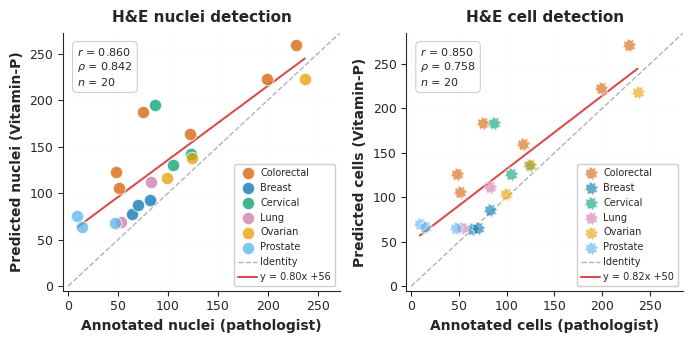

In [21]:
"""
Publication-Quality Correlation Plot with Biological Shapes
Pathologist vs Vitamin-P Detection Agreement
Using custom nucleus and cell shapes for Nature Methods
"""

import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.path import Path
from matplotlib.markers import MarkerStyle
from scipy.stats import pearsonr, spearmanr
import glob
import warnings

# Suppress font warnings
warnings.filterwarnings('ignore', category=UserWarning, module='matplotlib')

# Set elegant publication-quality style
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['DejaVu Sans', 'Liberation Sans', 'Arial', 'Helvetica'],
    'font.size': 9,
    'axes.labelsize': 10,
    'axes.titlesize': 11,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 8,
    'axes.linewidth': 0.8,
    'xtick.major.width': 0.8,
    'ytick.major.width': 0.8,
    'xtick.major.size': 3.5,
    'ytick.major.size': 3.5,
    'lines.linewidth': 1.5,
    'pdf.fonttype': 42,
    'ps.fonttype': 42,
})

# Paths
PATHOLOGIST_DIR = "/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Pathology_val"
RESULTS_DIR = "results_pathologist_public"

def load_geojson(filepath):
    """Load GeoJSON file"""
    with open(filepath, 'r') as f:
        return json.load(f)

def count_annotations_from_geojson(geojson_data):
    """Count features in GeoJSON"""
    return len(geojson_data.get('features', []))

def parse_pathologist_annotations(geojson_data):
    """Parse pathologist annotations to count cells and nuclei"""
    cells = 0
    nuclei = 0
    
    if 'features' in geojson_data:
        for feature in geojson_data['features']:
            properties = feature.get('properties', {})
            classification = properties.get('classification', {})
            
            if isinstance(classification, dict):
                annotation_type = classification.get('name', '').lower()
            else:
                annotation_type = str(classification).lower()
            
            object_type = properties.get('objectType', '').lower()
            
            if 'cell' in annotation_type or 'cell' in object_type:
                cells += 1
            else:
                nuclei += 1
    
    return cells, nuclei

def get_tissue_type(case_name):
    """Determine tissue type from case name"""
    if case_name.startswith('CRC'):
        return 'Colorectal'
    elif 'breast' in case_name.lower():
        return 'Breast'
    elif 'cervical' in case_name.lower():
        return 'Cervical'
    elif 'lung' in case_name.lower():
        return 'Lung'
    elif 'ovarian' in case_name.lower():
        return 'Ovarian'
    elif 'prostate' in case_name.lower():
        return 'Prostate'
    else:
        return 'Other'

def create_cell_marker():
    """Create a cell-like marker with irregular outer membrane (like uploaded image)"""
    # Create organic cell shape with wavy/irregular membrane
    theta = np.linspace(0, 2*np.pi, 40)
    # Multiple frequency components for irregular membrane look
    r = 1.0 + 0.15*np.sin(8*theta) + 0.1*np.cos(13*theta) + 0.08*np.sin(17*theta)
    x = r * np.cos(theta)
    y = r * np.sin(theta)
    vertices = np.column_stack([x, y])
    codes = [Path.MOVETO] + [Path.LINETO] * (len(vertices) - 2) + [Path.CLOSEPOLY]
    return Path(vertices, codes)

# ============================================================================
# COLLECT DATA
# ============================================================================

print("="*100)
print("LOADING PATHOLOGIST AND VITAMIN-P PREDICTIONS")
print("="*100)

all_data = []

for sample_id in range(1, 21):
    pathologist_dir = os.path.join(PATHOLOGIST_DIR, str(sample_id))
    geojson_files = glob.glob(os.path.join(pathologist_dir, "*.geojson"))
    
    if not geojson_files:
        continue
    
    path_geojson = load_geojson(geojson_files[0])
    path_cells, path_nuclei = parse_pathologist_annotations(path_geojson)
    
    he_files = glob.glob(os.path.join(pathologist_dir, "*-he*.png"))
    if he_files:
        import re
        match = re.match(r'(.+?)-he_chunk_(\d+)', os.path.basename(he_files[0]))
        case_name = match.group(1) if match else "unknown"
    else:
        case_name = "unknown"
    
    tissue_type = get_tissue_type(case_name)
    
    vitaminp_dir = os.path.join(RESULTS_DIR, f"sample_{sample_id:02d}")
    
    vp_he_nuclei_file = os.path.join(vitaminp_dir, 'he_nuclei', 'nuclei_segmentation.geojson')
    vp_mif_cell_file = os.path.join(vitaminp_dir, 'mif_cell', 'cell_segmentation.geojson')
    
    vp_he_nuclei = count_annotations_from_geojson(load_geojson(vp_he_nuclei_file)) if os.path.exists(vp_he_nuclei_file) else 0
    vp_mif_cells = count_annotations_from_geojson(load_geojson(vp_mif_cell_file)) if os.path.exists(vp_mif_cell_file) else 0
    
    all_data.append({
        'sample_id': sample_id,
        'tissue_type': tissue_type,
        'path_nuclei': path_nuclei,
        'path_cells': path_cells,
        'vp_he_nuclei': vp_he_nuclei,
        'vp_mif_cells': vp_mif_cells,
    })

df = pd.DataFrame(all_data)
print(f"✅ Loaded {len(df)} samples\n")

# ============================================================================
# COMBINED CORRELATION PLOT WITH BIOLOGICAL SHAPES
# ============================================================================

# Create custom cell marker (nuclei will be circles)
cell_marker = create_cell_marker()

# Elegant color palette (colorblind-friendly)
tissue_colors = {
    'Colorectal': '#D55E00',
    'Breast': '#0072B2',
    'Cervical': '#009E73',
    'Lung': '#CC79A7',
    'Ovarian': '#E69F00',
    'Prostate': '#56B4E9'
}

fig, axes = plt.subplots(1, 2, figsize=(7, 3.5))
fig.patch.set_facecolor('white')

# ===== PANEL A: H&E NUCLEI =====
ax = axes[0]

x = df['path_nuclei'].values
y = df['vp_he_nuclei'].values

# Plot nuclei with simple circles
for tissue in df['tissue_type'].unique():
    mask = df['tissue_type'] == tissue
    ax.scatter(x[mask], y[mask],
              s=80,
              alpha=0.75,
              c=[tissue_colors[tissue]],
              edgecolors='white',
              linewidth=0.8,
              marker='o',  # Simple circle
              label=tissue,
              zorder=3)

# Identity line (perfect agreement)
max_val = max(x.max(), y.max()) * 1.05
ax.plot([0, max_val], [0, max_val], 
        'k--', linewidth=1, alpha=0.3, 
        label='Identity', zorder=1)

# Regression line
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
x_line = np.linspace(x.min(), x.max(), 100)
ax.plot(x_line, p(x_line), 
        color='#CC0000', linewidth=1.5, alpha=0.7,
        label=f'y = {z[0]:.2f}x {z[1]:+.0f}',
        zorder=2)

# Statistics box
r_pearson, p_pearson = pearsonr(x, y)
r_spearman, _ = spearmanr(x, y)

stats_text = (f"$r$ = {r_pearson:.3f}\n"
              f"$ρ$ = {r_spearman:.3f}\n"
              f"$n$ = {len(df)}")

ax.text(0.05, 0.95, stats_text,
        transform=ax.transAxes,
        fontsize=8,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.4', 
                  facecolor='white', 
                  edgecolor='#CCCCCC',
                  alpha=0.95,
                  linewidth=0.8))

# Styling
ax.set_xlabel('Annotated nuclei (pathologist)', fontsize=10)
ax.set_ylabel('Predicted nuclei (Vitamin-P)', fontsize=10)
ax.set_title('H&E nuclei detection', fontsize=11, pad=8)
ax.legend(loc='lower right', framealpha=0.95, edgecolor='#CCCCCC', 
          fontsize=7, handletextpad=0.3, borderpad=0.4, frameon=True)
ax.grid(True, alpha=0.2, linestyle=':', linewidth=0.5, color='#CCCCCC')
ax.set_xlim(-5, max_val)
ax.set_ylim(-5, max_val)

# Remove top and right spines for clean look
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# ===== PANEL B: H&E CELLS =====
ax = axes[1]

x = df['path_cells'].values
y = df['vp_mif_cells'].values

# Plot cells with custom biological shape
for tissue in df['tissue_type'].unique():
    mask = df['tissue_type'] == tissue
    ax.scatter(x[mask], y[mask],
              s=120,
              alpha=0.6,
              c=[tissue_colors[tissue]],
              edgecolors='white',
              linewidth=0.8,
              marker=cell_marker,
              label=tissue,
              zorder=3)

# Identity line
max_val = max(x.max(), y.max()) * 1.05
ax.plot([0, max_val], [0, max_val],
        'k--', linewidth=1, alpha=0.3,
        label='Identity', zorder=1)

# Regression line
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
x_line = np.linspace(x.min(), x.max(), 100)
ax.plot(x_line, p(x_line),
        color='#CC0000', linewidth=1.5, alpha=0.7,
        label=f'y = {z[0]:.2f}x {z[1]:+.0f}',
        zorder=2)

# Statistics box
r_pearson, p_pearson = pearsonr(x, y)
r_spearman, _ = spearmanr(x, y)

stats_text = (f"$r$ = {r_pearson:.3f}\n"
              f"$ρ$ = {r_spearman:.3f}\n"
              f"$n$ = {len(df)}")

ax.text(0.05, 0.95, stats_text,
        transform=ax.transAxes,
        fontsize=8,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.4',
                  facecolor='white',
                  edgecolor='#CCCCCC',
                  alpha=0.95,
                  linewidth=0.8))

# Styling
ax.set_xlabel('Annotated cells (pathologist)', fontsize=10)
ax.set_ylabel('Predicted cells (Vitamin-P)', fontsize=10)
ax.set_title('H&E cell detection', fontsize=11, pad=8)
ax.legend(loc='lower right', framealpha=0.95, edgecolor='#CCCCCC',
          fontsize=7, handletextpad=0.3, borderpad=0.4, frameon=True)
ax.grid(True, alpha=0.2, linestyle=':', linewidth=0.5, color='#CCCCCC')
ax.set_xlim(-5, max_val)
ax.set_ylim(-5, max_val)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
# Force all axes to have equal aspect ratio
for ax in axes:
    ax.set_aspect('equal')
# Save as editable PDF
output_pdf = 'correlation_plot_separate_panels.pdf'
plt.savefig(output_pdf, format='pdf', dpi=300, bbox_inches='tight')
print(f"\n✅ Figure saved as: {output_pdf}")

# ============================================================================
# SUMMARY STATISTICS
# ============================================================================

print("="*100)
print("SUMMARY STATISTICS")
print("="*100)

print("\nH&E NUCLEI:")
print(f"  Pathologist: {df['path_nuclei'].mean():.1f} ± {df['path_nuclei'].std():.1f}")
print(f"  Vitamin-P:   {df['vp_he_nuclei'].mean():.1f} ± {df['vp_he_nuclei'].std():.1f}")
r, p = pearsonr(df['path_nuclei'], df['vp_he_nuclei'])
print(f"  Pearson r:   {r:.3f} (p={p:.2e})")

print("\nmIF CELLS:")
print(f"  Pathologist: {df['path_cells'].mean():.1f} ± {df['path_cells'].std():.1f}")
print(f"  Vitamin-P:   {df['vp_mif_cells'].mean():.1f} ± {df['vp_mif_cells'].std():.1f}")
r, p = pearsonr(df['path_cells'], df['vp_mif_cells'])
print(f"  Pearson r:   {r:.3f} (p={p:.2e})")

print("="*100)

LOADING SAMPLE 20
✅ Found: CRC28 chunk 43
✅ mIF image shape: (2, 512, 512) (has 2 channels)
   Using channel 0 for nuclei
✅ Loaded from TRAIN dataset
   H&E image shape: (512, 512, 3)
   mIF nuclei channel shape: (512, 512)
✅ Pathologist sample 20: 122 nuclei
✅ Vitamin-P: 164 nuclei
✅ Missing detections: 46 nuclei (+37.7%)

✅ Figure saved as: hidden_detections_nuclei.pdf

QUANTITATIVE SUMMARY
Metric                         Pathologist     Vitamin-P       Missing         % Increase     
----------------------------------------------------------------------------------------------------
Nuclei                         122             164             46                37.7%

INTERPRETATION:

NUCLEI DETECTION:
  Col 1: Pathologist manually annotated 122 nuclei on H&E
  Col 2: Vitamin-P predicted 164 nuclei using cross-modal learning
  Col 3: 46 additional nuclei found by VP (hard to see in H&E)
  Col 4: Same nuclei clearly visible in mIF DAPI channel (molecular evidence)

Key Insight:
Vitam

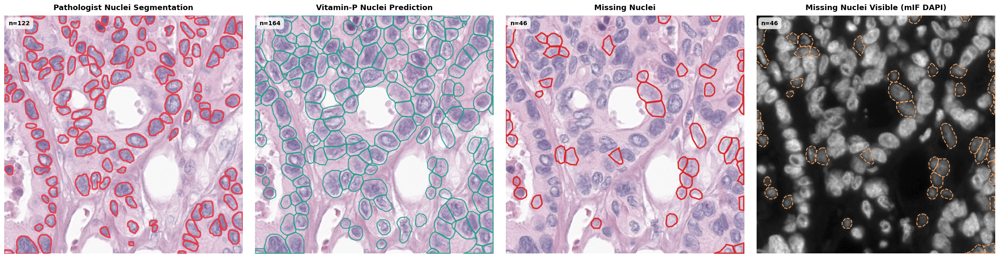

In [34]:
"""
"Hidden Detections" Visualization - NUCLEI ONLY VERSION
Shows what Vitamin-P detects that pathologists cannot see in H&E microscopy
Demonstrates cross-modal learning advantage

Single row × 4 columns layout:
NUCLEI: Pathologist | Vitamin-P | Missing | mIF Nuclei Channel (DAPI)
"""

import os
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon as MplPolygon
from shapely.geometry import Polygon as ShapelyPolygon, Point
from PIL import Image
import glob
import torch
from scipy import ndimage
import re
import warnings

# Suppress warnings
warnings.filterwarnings('ignore')

# ============================================================================
# USER CONFIGURATION - CHANGE THIS TO SELECT DIFFERENT SAMPLES
# ============================================================================
SAMPLE_ID = 20  # Change this to any number 1-20 to visualize different samples
# ============================================================================

# Set elegant publication style
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['DejaVu Sans', 'Liberation Sans', 'Arial', 'Helvetica'],
    'font.size': 11,
    'axes.labelsize': 12,
    'axes.titlesize': 13,
    'figure.titlesize': 16,
    'font.weight': 'normal',
    'axes.labelweight': 'bold',
    'axes.titleweight': 'bold',
    'axes.linewidth': 0,  # No box around images
    'pdf.fonttype': 42,
    'ps.fonttype': 42,
})

# Paths
PATHOLOGIST_DIR = "/rsrch9/home/plm/idso_fa1_pathology/TIER2/yasin-vitaminp/Pathology_val"
RESULTS_DIR = "results_pathologist_public"

def load_geojson(filepath):
    """Load GeoJSON file"""
    with open(filepath, 'r') as f:
        return json.load(f)

def geojson_to_shapely_polygons(geojson_data):
    """Convert GeoJSON to Shapely polygons"""
    polygons = []
    if 'features' not in geojson_data:
        return polygons
    
    for feature in geojson_data['features']:
        try:
            geom = feature['geometry']
            coords = geom['coordinates']
            if geom['type'] == 'Polygon':
                poly = ShapelyPolygon(coords[0])
                if poly.is_valid and poly.area > 0:
                    polygons.append(poly)
        except:
            continue
    return polygons

def parse_pathologist_geojson(geojson_data):
    """Parse pathologist GeoJSON to get nuclei only"""
    nuclei = []
    
    if 'features' not in geojson_data:
        return nuclei
    
    for feature in geojson_data['features']:
        try:
            coords = feature['geometry']['coordinates']
            coords_array = coords
            while isinstance(coords_array, list) and len(coords_array) > 0 and isinstance(coords_array[0], list):
                if len(coords_array[0]) == 2 and isinstance(coords_array[0][0], (int, float)):
                    break
                coords_array = coords_array[0]
            
            if len(coords_array) > 2:
                poly = ShapelyPolygon(coords_array)
                if poly.is_valid and poly.area > 0:
                    # Determine if it's a cell or nucleus based on properties
                    properties = feature.get('properties', {})
                    classification = properties.get('classification', {})
                    if isinstance(classification, dict):
                        annotation_type = classification.get('name', '').lower()
                    else:
                        annotation_type = str(classification).lower()
                    
                    object_type = properties.get('objectType', '').lower()
                    
                    # Only keep nuclei (skip cells)
                    if 'cell' not in annotation_type and 'cell' not in object_type:
                        nuclei.append(poly)
        except:
            continue
    
    return nuclei

def find_unmatched_predictions(vp_polygons, path_polygons, distance_threshold=15):
    """
    Find VP predictions that don't match any pathologist annotation
    Uses centroid distance for matching (more forgiving than IoU)
    """
    matched_vp = set()
    
    for i, vp_poly in enumerate(vp_polygons):
        vp_centroid = vp_poly.centroid
        
        # Check if this VP prediction is close to any pathologist annotation
        for path_poly in path_polygons:
            path_centroid = path_poly.centroid
            distance = vp_centroid.distance(path_centroid)
            
            if distance < distance_threshold:
                matched_vp.add(i)
                break
    
    # Return indices of unmatched VP predictions
    unmatched_indices = [i for i in range(len(vp_polygons)) if i not in matched_vp]
    return unmatched_indices

def find_matching_patch_in_dataset(case_name, chunk_num, dataset):
    """Find the matching patch in the dataset"""
    for idx, (sample, patch_idx) in enumerate(dataset.patch_info):
        if sample == case_name and patch_idx == chunk_num:
            return idx
    return None

def get_case_info_from_sample(sample_id):
    """Extract case name and chunk number from pathologist sample directory"""
    sample_dir = os.path.join(PATHOLOGIST_DIR, str(sample_id))
    
    if not os.path.exists(sample_dir):
        return None, None
    
    # Find H&E image file
    he_files = glob.glob(os.path.join(sample_dir, "*-he*.png"))
    if not he_files:
        return None, None
    
    # Extract case name and chunk from filename
    # Expected format: {CASE_NAME}-he_chunk_{CHUNK_NUM}.png
    he_filename = os.path.basename(he_files[0])
    match = re.match(r'(.+?)-he_chunk_(\d+)', he_filename)
    
    if match:
        case_name = match.group(1)
        chunk_num = int(match.group(2))
        return case_name, chunk_num
    
    return None, None

# ============================================================================
# STEP 1: GET CASE INFO FROM PATHOLOGIST SAMPLE
# ============================================================================

print("="*100)
print(f"LOADING SAMPLE {SAMPLE_ID}")
print("="*100)

CASE_NAME, CHUNK_NUM = get_case_info_from_sample(SAMPLE_ID)

if CASE_NAME is None:
    print(f"❌ Could not find valid data for sample {SAMPLE_ID}")
    raise ValueError(f"Sample {SAMPLE_ID} not found or invalid")

print(f"✅ Found: {CASE_NAME} chunk {CHUNK_NUM}")

# ============================================================================
# STEP 2: LOAD DATA FROM DATASET
# ============================================================================

# Determine which dataset split contains our case
if CASE_NAME in train_loader.dataset.samples:
    dataset = train_loader.dataset
    split_name = "TRAIN"
elif CASE_NAME in val_loader.dataset.samples:
    dataset = val_loader.dataset
    split_name = "VALIDATION"
elif CASE_NAME in test_loader.dataset.samples:
    dataset = test_loader.dataset
    split_name = "TEST"
else:
    print(f"❌ {CASE_NAME} not found in dataset!")
    raise ValueError(f"Case {CASE_NAME} not found")

# Find matching patch
patch_idx = find_matching_patch_in_dataset(CASE_NAME, CHUNK_NUM, dataset)
if patch_idx is None:
    print(f"❌ Chunk {CHUNK_NUM} not found!")
    raise ValueError(f"Chunk {CHUNK_NUM} not found")

# Load sample from dataset
dataset_sample = dataset[patch_idx]

# Extract images from dataset
he_img = dataset_sample['he_image'].permute(1, 2, 0).numpy()  # C,H,W -> H,W,C
he_img = (he_img * 255).astype(np.uint8)

mif_img_full = dataset_sample['mif_image'].numpy()  # Shape: (C, H, W)

print(f"✅ mIF image shape: {mif_img_full.shape} (has {mif_img_full.shape[0]} channels)")

# Extract nuclei channel only
if mif_img_full.shape[0] == 2:
    mif_nuclei_channel = mif_img_full[0]  # Use first channel for nuclei
    print(f"   Using channel 0 for nuclei")
elif mif_img_full.shape[0] == 3:
    mif_nuclei_channel = mif_img_full[2]  # DAPI channel (nuclei)
    print(f"   Using channel 2 for nuclei")
else:
    mif_nuclei_channel = mif_img_full[0]
    print(f"   ⚠️ Unexpected channel count, using channel 0")

# Normalize and BRIGHTEN for visualization
mif_nuclei_vis = ((mif_nuclei_channel - mif_nuclei_channel.min()) / 
                  (mif_nuclei_channel.max() - mif_nuclei_channel.min() + 1e-8) * 255).astype(np.uint8)

# Apply brightness boost (gamma correction)
mif_nuclei_vis = np.power(mif_nuclei_vis / 255.0, 0.6) * 255  # gamma < 1 brightens
mif_nuclei_vis = mif_nuclei_vis.astype(np.uint8)

# Create RGB image from grayscale channel
mif_nuclei_rgb = np.stack([mif_nuclei_vis, mif_nuclei_vis, mif_nuclei_vis], axis=-1)

print(f"✅ Loaded from {split_name} dataset")
print(f"   H&E image shape: {he_img.shape}")
print(f"   mIF nuclei channel shape: {mif_nuclei_vis.shape}")

# ============================================================================
# STEP 3: LOAD PATHOLOGIST ANNOTATIONS
# ============================================================================

pathologist_dir = os.path.join(PATHOLOGIST_DIR, str(SAMPLE_ID))
geojson_files = glob.glob(os.path.join(pathologist_dir, "*.geojson"))

# Load pathologist annotations
path_geojson = load_geojson(geojson_files[0])
path_nuclei = parse_pathologist_geojson(path_geojson)

print(f"✅ Pathologist sample {SAMPLE_ID}: {len(path_nuclei)} nuclei")

# ============================================================================
# STEP 4: LOAD VITAMIN-P PREDICTIONS
# ============================================================================

vitaminp_dir = os.path.join(RESULTS_DIR, f"sample_{SAMPLE_ID:02d}")

# Load nuclei predictions
vp_nuclei_file = os.path.join(vitaminp_dir, 'he_nuclei', 'nuclei_segmentation.geojson')
vp_nuclei_geojson = load_geojson(vp_nuclei_file)
vp_nuclei = geojson_to_shapely_polygons(vp_nuclei_geojson)

print(f"✅ Vitamin-P: {len(vp_nuclei)} nuclei")

# ============================================================================
# STEP 5: FIND MISSING DETECTIONS
# ============================================================================

missing_nuclei_indices = find_unmatched_predictions(vp_nuclei, path_nuclei, distance_threshold=15)
missing_nuclei = [vp_nuclei[i] for i in missing_nuclei_indices]

print(f"✅ Missing detections: {len(missing_nuclei)} nuclei (+{len(missing_nuclei)/max(1,len(path_nuclei))*100:.1f}%)")

# ============================================================================
# CREATE VISUALIZATION: 1 ROW × 4 COLUMNS
# ============================================================================

fig, axes = plt.subplots(1, 4, figsize=(24, 6))
fig.patch.set_facecolor('white')

def draw_polygons_elegant(ax, img, polygons, color, linewidth=2, alpha=0.9, label=None, linestyle='-'):
    """Draw polygons with elegant styling"""
    ax.imshow(img, cmap='gray' if len(img.shape) == 2 else None, aspect='equal')
    for poly in polygons:
        coords = np.array(poly.exterior.coords)
        ax.plot(coords[:, 0], coords[:, 1], 
                color=color, linewidth=linewidth, alpha=alpha,
                linestyle=linestyle,
                solid_capstyle='round', solid_joinstyle='round')
    ax.axis('off')
    if label:
        ax.text(0.02, 0.98, label, transform=ax.transAxes,
                fontsize=10, verticalalignment='top',
                bbox=dict(boxstyle='round,pad=0.5', facecolor='white', 
                         edgecolor='none', alpha=0.8),
                color='black', fontweight='bold')

# ============================================================================
# NUCLEI ROW
# ============================================================================

# Column 1: H&E with Pathologist nuclei
draw_polygons_elegant(axes[0], he_img, path_nuclei, 
                      color='#E63946', linewidth=2.5,
                      label=f'n={len(path_nuclei)}')
axes[0].set_title('Pathologist Nuclei Segmentation', 
                  fontweight='bold', fontsize=13, pad=10, color='black')

# Column 2: H&E with Vitamin-P nuclei predictions (TEAL/GREEN)
draw_polygons_elegant(axes[1], he_img, vp_nuclei,
                      color='#2A9D8F', linewidth=1.8,  # Teal/green color
                      label=f'n={len(vp_nuclei)}')
axes[1].set_title('Vitamin-P Nuclei Prediction',
                  fontweight='bold', fontsize=13, pad=10, color='black')

# Column 3: H&E with MISSING nuclei highlighted in RED
axes[2].imshow(he_img, aspect='equal')
# Draw pathologist annotations faintly
for poly in path_nuclei:
    coords = np.array(poly.exterior.coords)
    axes[2].plot(coords[:, 0], coords[:, 1],
                 color='gray', linewidth=1, alpha=0.3, linestyle='--')
# Highlight missing detections in RED
for poly in missing_nuclei:
    coords = np.array(poly.exterior.coords)
    axes[2].plot(coords[:, 0], coords[:, 1],
                 color='#D62828', linewidth=2.5, alpha=0.95,
                 solid_capstyle='round', solid_joinstyle='round')
axes[2].text(0.02, 0.98, f'n={len(missing_nuclei)}', 
             transform=axes[2].transAxes,
             fontsize=10, verticalalignment='top',
             bbox=dict(boxstyle='round,pad=0.5', facecolor='white',
                      edgecolor='none', alpha=0.8),
             color='black', fontweight='bold')
axes[2].set_title('Missing Nuclei',
                  fontweight='bold', fontsize=13, pad=10, color='black')
axes[2].axis('off')

# Column 4: mIF NUCLEI channel showing missing ARE visible (YELLOW DASHED)
draw_polygons_elegant(axes[3], mif_nuclei_rgb, missing_nuclei,
                      color='#F4A261', linewidth=1.5, alpha=0.95,  # Yellow/orange color
                      linestyle='--',  # DASHED
                      label=f'n={len(missing_nuclei)}')
axes[3].set_title('Missing Nuclei Visible (mIF DAPI)',
                  fontweight='bold', fontsize=13, pad=10, color='black')

# ============================================================================
# FORCE ALL SUBPLOTS TO HAVE IDENTICAL SIZE
# ============================================================================

# Get the image dimensions
img_height, img_width = he_img.shape[:2]

# Set identical limits for all axes
for ax in axes:
    ax.set_xlim([0, img_width])
    ax.set_ylim([img_height, 0])  # Inverted y-axis for image coordinates
    ax.set_aspect('equal', adjustable='box')

plt.tight_layout()

# Save as PDF in current directory
output_pdf = 'hidden_detections_nuclei.pdf'
plt.savefig(output_pdf, format='pdf', dpi=300, bbox_inches='tight')
print(f"\n✅ Figure saved as: {output_pdf}")

# ============================================================================
# PRINT SUMMARY
# ============================================================================

print("\n" + "="*100)
print("QUANTITATIVE SUMMARY")
print("="*100)
print(f"{'Metric':<30} {'Pathologist':<15} {'Vitamin-P':<15} {'Missing':<15} {'% Increase':<15}")
print("-"*100)
print(f"{'Nuclei':<30} {len(path_nuclei):<15} {len(vp_nuclei):<15} {len(missing_nuclei):<15} "
      f"{len(missing_nuclei)/max(1,len(path_nuclei))*100:>6.1f}%")
print("="*100)

print("\n" + "="*100)
print("INTERPRETATION:")
print("="*100)
print(f"""
NUCLEI DETECTION:
  Col 1: Pathologist manually annotated {len(path_nuclei)} nuclei on H&E
  Col 2: Vitamin-P predicted {len(vp_nuclei)} nuclei using cross-modal learning
  Col 3: {len(missing_nuclei)} additional nuclei found by VP (hard to see in H&E)
  Col 4: Same nuclei clearly visible in mIF DAPI channel (molecular evidence)

Key Insight:
Vitamin-P learned to detect nuclei in H&E that are invisible or ambiguous to
pathologists by leveraging paired mIF training data with DAPI nuclear staining.
The dashed yellow boundaries in the last panel highlight these "hidden" nuclei
that are clearly visible when molecular markers are used.

This demonstrates the power of cross-modal learning for enhanced detection.
""")
print("="*100)